In [1]:
!pip install gdown
!pip install torchmetrics
!pip install segmentation_models_pytorch
!pip install albumentations
!pip install timm

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.5/109.5 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 37.0 MB/s eta 0:00:00a 0:00:01
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16427 sha256=1315c9ced3a731af45cfb41439b6e07243ea2794f1767f757443f179fed7601d
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60945 sha256=7b5eebdaaf03bcb6e46aa082506fa00d5c9003ddb3552f3b375a358338a19eb2
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientne

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt 
import torchmetrics
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
import os
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [3]:
class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std  = std
        
    def __call__(self, tensor):
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
        return tensor

class AverageMeter(object):
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count
        
def accuracy_function(preds, targets):
    preds_flat = preds.flatten()
    targets_flat = targets.flatten()
    acc = torch.sum(preds_flat == targets_flat)
    return acc/targets_flat.shape[0]

unorm = UnNormalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))

In [4]:
# https://github.com/albumentations-team/autoalbument/blob/master/examples/pascal_voc/dataset.py
from torchvision.datasets import VOCSegmentation

cv2.setNumThreads(0)
cv2.ocl.setUseOpenCL(False)


VOC_CLASSES = [
    "background",
    "aeroplane",
    "bicycle",
    "bird",
    "boat",
    "bottle",
    "bus",
    "car",
    "cat",
    "chair",
    "cow",
    "diningtable",
    "dog",
    "horse",
    "motorbike",
    "person",
    "potted plant",
    "sheep",
    "sofa",
    "train",
    "tv/monitor",
]


VOC_COLORMAP = [
    [0, 0, 0],
    [128, 0, 0],
    [0, 128, 0],
    [128, 128, 0],
    [0, 0, 128],
    [128, 0, 128],
    [0, 128, 128],
    [128, 128, 128],
    [64, 0, 0],
    [192, 0, 0],
    [64, 128, 0],
    [192, 128, 0],
    [64, 0, 128],
    [192, 0, 128],
    [64, 128, 128],
    [192, 128, 128],
    [0, 64, 0],
    [128, 64, 0],
    [0, 192, 0],
    [128, 192, 0],
    [0, 64, 128],
]


class PascalVOCSearchDataset(VOCSegmentation):
    def __init__(self, root="~/data/pascal_voc", image_set="train", download=True, transform=None):
        super().__init__(root=root, image_set=image_set, download=download, transform=transform)

    @staticmethod
    def _convert_to_segmentation_mask(mask):
        # This function converts a mask from the Pascal VOC format to the format required by AutoAlbument.
        #
        # Pascal VOC uses an RGB image to encode the segmentation mask for that image. RGB values of a pixel
        # encode the pixel's class.
        #
        # AutoAlbument requires a segmentation mask to be a NumPy array with the shape [height, width, num_classes].
        # Each channel in this mask should encode values for a single class. Pixel in a mask channel should have
        # a value of 1.0 if the pixel of the image belongs to this class and 0.0 otherwise.
        height, width = mask.shape[:2]
        segmentation_mask = np.zeros((height, width, len(VOC_COLORMAP)), dtype=np.float32)
        for label_index, label in enumerate(VOC_COLORMAP):
            segmentation_mask[:, :, label_index] = np.all(mask == label, axis=-1).astype(float)
        return segmentation_mask

    def __getitem__(self, index):
        image = cv2.imread(self.images[index])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks[index])
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = self._convert_to_segmentation_mask(mask)
        if self.transform is not None:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]
        return image, mask


trainsize = 256

train_transform = A.Compose([
    A.Resize(width=trainsize, height=trainsize),
    A.HorizontalFlip(),
    A.RandomBrightnessContrast(),
    A.Blur(),
    A.RGBShift(),
    A.Sharpen(),
    A.CoarseDropout(max_holes=5, max_height=int(384 * 0.1), max_width=int(384 * 0.1)),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0),
    ToTensorV2(),
])

test_transform = A.Compose([
    A.Resize(width=trainsize, height=trainsize),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0),
    ToTensorV2(),
])


train_dataset =  PascalVOCSearchDataset(image_set="train", download=True, transform=train_transform)
test_dataset = PascalVOCSearchDataset(image_set="val", download=True, transform=test_transform)

100%|██████████| 1999639040/1999639040 [00:52<00:00, 37909203.04it/s]


Extracting /root/data/pascal_voc/VOCtrainval_11-May-2012.tar to /root/data/pascal_voc
Using downloaded and verified file: /root/data/pascal_voc/VOCtrainval_11-May-2012.tar
Extracting /root/data/pascal_voc/VOCtrainval_11-May-2012.tar to /root/data/pascal_voc


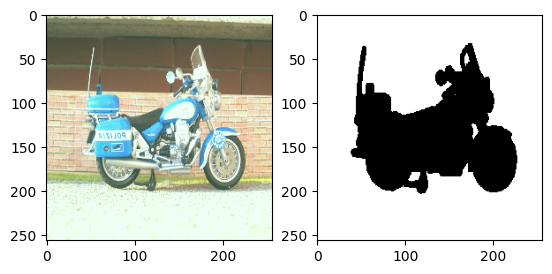

In [5]:
image, mask = train_dataset.__getitem__(800)
plt.subplot(1, 2, 1)
plt.imshow(unorm(image).permute(1, 2, 0)) 
plt.subplot(1, 2, 2)
plt.imshow(mask[:, :, 0], cmap='gray')

plt.show()

In [5]:
#metrics
def intersectionAndUnionGPU(output, target, K, ignore_index=255):
    # 'K' classes, output and target sizes are N or N * L or N * H * W, each value in range 0 to K - 1.
    assert (output.dim() in [1, 2, 3])
    assert output.shape == target.shape
    output = output.view(-1)
    target = target.view(-1)
    output[target == ignore_index] = ignore_index
    intersection = output[output == target]
    area_intersection = torch.histc(intersection, bins=K, min=0, max=K-1)
    area_output = torch.histc(output, bins=K, min=0, max=K-1)
    area_target = torch.histc(target, bins=K, min=0, max=K-1)
    area_union = area_output + area_target - area_intersection
    return area_intersection, area_union, area_target 

# Feature Pyramid Network(FPN)

In [7]:
# https://pytorch.org/vision/main/generated/torchvision.ops.FeaturePyramidNetwork.html
import timm
import torchvision
from torchvision.ops import FeaturePyramidNetwork
from collections import OrderedDict
class FPNSegmentation(nn.Module):
    def __init__(self, backbone_name, fpn_channel, n_classes):
        super().__init__()
        self.backbone = timm.create_model(backbone_name, pretrained=True, features_only=True, out_indices = (1,2,3,4)) #0 gần với ảnh đầu vào có thể gây nhiễu
        self.n_classes = n_classes
        self.fpn_channel = fpn_channel
        self.in_channels_list = self.backbone.feature_info.channels()
        # print(self.in_channels_list)
        # self.fpn = FeaturePyramidNetwork([256, 512, 1024, 2048], 5) # in_channels_list, out_channels
        self.fpn = FeaturePyramidNetwork(self.in_channels_list, self.fpn_channel)
        self.conv_cls = nn.Conv2d(self.fpn_channel, self.n_classes, 1, 1, 0)


    def forward(self, x):
        # x = self.backbone(x)
        # for x in x:
        #     print(x.shape)
        # return None
        ori_size = x.shape[2:] # (H, W)
        x1, x2, x3, x4 = self.backbone(x)
        features = OrderedDict()
        features["x1"] = x1
        features["x2"] = x2
        features["x3"] = x3
        features["x4"] = x4
        fpn_features = self.fpn(features)
        # print([(k, v.shape) for k, v in fpn_features.items()])

        x = fpn_features["x1"] \
            + F.interpolate(fpn_features["x2"], size=fpn_features["x1"].shape[2:], mode="bilinear") \
            + F.interpolate(fpn_features["x3"], size=fpn_features["x1"].shape[2:], mode="bilinear") \
            + F.interpolate(fpn_features["x4"], size=fpn_features["x1"].shape[2:], mode="bilinear")
        x = self.conv_cls(x)
        return F.interpolate(x, size=ori_size, mode="bilinear")
        
model = FPNSegmentation("resnet50", 256, 21)
x = torch.rand(2,3,256,256)
y = model(x)      
print(y.shape)

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

torch.Size([2, 21, 256, 256])


In [12]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_size = 64
n_workers = 4
print("num_workers =", n_workers)
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                          shuffle=True, num_workers=n_workers)
testloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,
                                          shuffle=False, num_workers=n_workers)

model = FPNSegmentation("resnet101", 256, 21).to(device)

# criterion = smp.losses.DiceLoss(mode="multiclass", classes=21)
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
n_eps = 60

train_loss_meter = AverageMeter()
intersection_meter = AverageMeter()
union_meter = AverageMeter()
target_meter = AverageMeter()

num_workers = 4


In [13]:
for ep in range(1, 1+n_eps):
    train_loss_meter.reset()
    intersection_meter.reset()
    union_meter.reset()
    target_meter.reset()
    model.train()

    for batch_id, (x, y) in enumerate(tqdm(trainloader), start=1):
        optimizer.zero_grad()
        n = x.shape[0]
        x = x.to(device).float()
        y = y.to(device).long()
        y = y.argmax(dim=-1)  # Convert (B, 256, 256, 21) -> (B, 256, 256)
        # print(y.shape)
        y_hat = model(x) #(B, C, H, W)
        # print(y_hat.shape)
        loss = criterion(y_hat, y) #(B, C, H, W) >< (B, H, W)
        loss.backward()
        optimizer.step()

        #save metrics
        with torch.no_grad():
            train_loss_meter.update(loss.item())
            y_hat_mask = y_hat.argmax(dim=1).squeeze(1) # (B, C, H, W) -> (B, 1, H, W) -> (B, H, W)
            intersection, union, target = intersectionAndUnionGPU(y_hat_mask.float(), y.float(), 21)
            intersection_meter.update(intersection)
            union_meter.update(union)
            target_meter.update(target)

    #compute iou, dice
    with torch.no_grad():
        iou_class = intersection_meter.sum / (union_meter.sum + 1e-10) #vector 21D
        dice_class = (2 * intersection_meter.sum) / (intersection_meter.sum + union_meter.sum + 1e-10) #vector 21D

        mIoU = torch.mean(iou_class) #mean vector 21D
        mDice = torch.mean(dice_class) #mean vector 21D

    print("EP {}, train loss = {} IoU = {}, dice = {}".format(ep, train_loss_meter.avg, mIoU, mDice))
    
    if ep >= 58:
        torch.save(model.state_dict(), "modelFPN_ep_{}.pth".format(ep))

100%|██████████| 23/23 [01:54<00:00,  4.97s/it]


EP 1, train loss = 4.36025187243586 IoU = 0.06210261955857277, dice = 0.09185966104269028


100%|██████████| 23/23 [01:55<00:00,  5.02s/it]


EP 2, train loss = 1.7325249132902727 IoU = 0.16387365758419037, dice = 0.24974600970745087


100%|██████████| 23/23 [01:49<00:00,  4.76s/it]


EP 3, train loss = 0.9584743302801381 IoU = 0.2747470736503601, dice = 0.40472611784935


100%|██████████| 23/23 [01:52<00:00,  4.88s/it]


EP 4, train loss = 0.752003594585087 IoU = 0.3596642315387726, dice = 0.5075414776802063


100%|██████████| 23/23 [01:52<00:00,  4.88s/it]


EP 5, train loss = 0.6525367602058079 IoU = 0.40915367007255554, dice = 0.5611571669578552


100%|██████████| 23/23 [01:55<00:00,  5.02s/it]


EP 6, train loss = 0.5719256349231886 IoU = 0.45479729771614075, dice = 0.607150137424469


100%|██████████| 23/23 [01:52<00:00,  4.91s/it]


EP 7, train loss = 0.5160144347211589 IoU = 0.49242839217185974, dice = 0.644074559211731


100%|██████████| 23/23 [01:51<00:00,  4.85s/it]


EP 8, train loss = 0.47480333758437115 IoU = 0.5175462365150452, dice = 0.664883553981781


100%|██████████| 23/23 [01:51<00:00,  4.86s/it]


EP 9, train loss = 0.4440198838710785 IoU = 0.5473426580429077, dice = 0.6928738355636597


100%|██████████| 23/23 [01:53<00:00,  4.93s/it]


EP 10, train loss = 0.41884970794553344 IoU = 0.5585564970970154, dice = 0.7018484473228455


100%|██████████| 23/23 [01:51<00:00,  4.86s/it]


EP 11, train loss = 0.38718412881312164 IoU = 0.5827286243438721, dice = 0.7229322195053101


100%|██████████| 23/23 [01:50<00:00,  4.83s/it]


EP 12, train loss = 0.3710216244925623 IoU = 0.5946156978607178, dice = 0.7337958812713623


100%|██████████| 23/23 [01:50<00:00,  4.81s/it]


EP 13, train loss = 0.3497202253859976 IoU = 0.6106127500534058, dice = 0.7471088171005249


100%|██████████| 23/23 [01:50<00:00,  4.82s/it]


EP 14, train loss = 0.32691541702851007 IoU = 0.6217228770256042, dice = 0.7558730244636536


100%|██████████| 23/23 [01:51<00:00,  4.86s/it]


EP 15, train loss = 0.3156608680020208 IoU = 0.633137583732605, dice = 0.7646726369857788


100%|██████████| 23/23 [01:52<00:00,  4.89s/it]


EP 16, train loss = 0.32268449664115906 IoU = 0.6342957019805908, dice = 0.7658547759056091


100%|██████████| 23/23 [01:52<00:00,  4.90s/it]


EP 17, train loss = 0.28651844807293103 IoU = 0.6596676111221313, dice = 0.7854596376419067


100%|██████████| 23/23 [01:51<00:00,  4.84s/it]


EP 18, train loss = 0.28009654581546783 IoU = 0.6664742827415466, dice = 0.7904111742973328


100%|██████████| 23/23 [01:49<00:00,  4.76s/it]


EP 19, train loss = 0.2810136487950449 IoU = 0.6654599905014038, dice = 0.7903882265090942


100%|██████████| 23/23 [01:52<00:00,  4.91s/it]


EP 20, train loss = 0.26378228742143384 IoU = 0.6797360777854919, dice = 0.8014888167381287


100%|██████████| 23/23 [01:52<00:00,  4.88s/it]


EP 21, train loss = 0.25409127642279083 IoU = 0.6839803457260132, dice = 0.8044888973236084


100%|██████████| 23/23 [01:51<00:00,  4.84s/it]


EP 22, train loss = 0.24146828249744748 IoU = 0.6931077837944031, dice = 0.8112462759017944


100%|██████████| 23/23 [01:50<00:00,  4.82s/it]


EP 23, train loss = 0.24385529691758362 IoU = 0.6958933472633362, dice = 0.812627911567688


100%|██████████| 23/23 [01:49<00:00,  4.78s/it]


EP 24, train loss = 0.23881058070970618 IoU = 0.7002913951873779, dice = 0.816511332988739


100%|██████████| 23/23 [01:49<00:00,  4.75s/it]


EP 25, train loss = 0.24099030054133871 IoU = 0.7006516456604004, dice = 0.8159947395324707


100%|██████████| 23/23 [01:49<00:00,  4.74s/it]


EP 26, train loss = 0.22477123270864072 IoU = 0.7105149030685425, dice = 0.8239948153495789


100%|██████████| 23/23 [01:50<00:00,  4.78s/it]


EP 27, train loss = 0.2252797095671944 IoU = 0.7152298092842102, dice = 0.8274372816085815


100%|██████████| 23/23 [01:50<00:00,  4.79s/it]


EP 28, train loss = 0.21670452408168628 IoU = 0.7164381146430969, dice = 0.8279190063476562


100%|██████████| 23/23 [01:49<00:00,  4.78s/it]


EP 29, train loss = 0.21739595221436542 IoU = 0.7174701690673828, dice = 0.8287492394447327


100%|██████████| 23/23 [01:52<00:00,  4.88s/it]


EP 30, train loss = 0.2056495437155599 IoU = 0.7270755171775818, dice = 0.8359448909759521


100%|██████████| 23/23 [01:53<00:00,  4.93s/it]


EP 31, train loss = 0.199435799666073 IoU = 0.7308821678161621, dice = 0.8385314345359802


100%|██████████| 23/23 [01:49<00:00,  4.75s/it]


EP 32, train loss = 0.19566261250039804 IoU = 0.739932119846344, dice = 0.844935417175293


100%|██████████| 23/23 [01:50<00:00,  4.80s/it]


EP 33, train loss = 0.19492904777112213 IoU = 0.7363983988761902, dice = 0.8417694568634033


100%|██████████| 23/23 [01:50<00:00,  4.82s/it]


EP 34, train loss = 0.18944386166075003 IoU = 0.7472640872001648, dice = 0.849862813949585


100%|██████████| 23/23 [01:49<00:00,  4.77s/it]


EP 35, train loss = 0.18645306385081747 IoU = 0.7449794411659241, dice = 0.848110020160675


100%|██████████| 23/23 [01:50<00:00,  4.81s/it]


EP 36, train loss = 0.18281253135722617 IoU = 0.7469258308410645, dice = 0.8491054773330688


100%|██████████| 23/23 [01:49<00:00,  4.76s/it]


EP 37, train loss = 0.1864296159018641 IoU = 0.7467573285102844, dice = 0.8494704365730286


100%|██████████| 23/23 [01:50<00:00,  4.81s/it]


EP 38, train loss = 0.1816424558991971 IoU = 0.7535318732261658, dice = 0.8540894985198975


100%|██████████| 23/23 [01:50<00:00,  4.82s/it]


EP 39, train loss = 0.17546081866907037 IoU = 0.759165346622467, dice = 0.8582428693771362


100%|██████████| 23/23 [01:49<00:00,  4.76s/it]


EP 40, train loss = 0.1846963186626849 IoU = 0.7521346807479858, dice = 0.8531938195228577


100%|██████████| 23/23 [01:49<00:00,  4.78s/it]


EP 41, train loss = 0.17752211055029993 IoU = 0.7543466687202454, dice = 0.854767382144928


100%|██████████| 23/23 [01:52<00:00,  4.90s/it]


EP 42, train loss = 0.16636490951413693 IoU = 0.767194390296936, dice = 0.8630571365356445


100%|██████████| 23/23 [01:50<00:00,  4.80s/it]


EP 43, train loss = 0.16913585300030914 IoU = 0.7627015113830566, dice = 0.8600801229476929


100%|██████████| 23/23 [01:52<00:00,  4.88s/it]


EP 44, train loss = 0.16577697577683823 IoU = 0.7633184194564819, dice = 0.8609119653701782


100%|██████████| 23/23 [01:50<00:00,  4.80s/it]


EP 45, train loss = 0.1604646632204885 IoU = 0.7725831270217896, dice = 0.8672641515731812


100%|██████████| 23/23 [01:52<00:00,  4.88s/it]


EP 46, train loss = 0.16585063221661941 IoU = 0.7633838057518005, dice = 0.8608123660087585


100%|██████████| 23/23 [01:51<00:00,  4.83s/it]


EP 47, train loss = 0.1638455041076826 IoU = 0.7644025683403015, dice = 0.8615940809249878


100%|██████████| 23/23 [01:51<00:00,  4.83s/it]


EP 48, train loss = 0.16410764598328134 IoU = 0.7706325054168701, dice = 0.8656417727470398


100%|██████████| 23/23 [01:52<00:00,  4.87s/it]


EP 49, train loss = 0.1581571445516918 IoU = 0.7712936401367188, dice = 0.8658545613288879


100%|██████████| 23/23 [01:51<00:00,  4.83s/it]


EP 50, train loss = 0.1553890445958013 IoU = 0.7757737636566162, dice = 0.8691092133522034


100%|██████████| 23/23 [01:53<00:00,  4.92s/it]


EP 51, train loss = 0.15246211834575818 IoU = 0.7773473262786865, dice = 0.8699655532836914


100%|██████████| 23/23 [01:51<00:00,  4.85s/it]


EP 52, train loss = 0.15268380356871564 IoU = 0.7789279818534851, dice = 0.870699405670166


100%|██████████| 23/23 [01:50<00:00,  4.81s/it]


EP 53, train loss = 0.1493344423563584 IoU = 0.7808663845062256, dice = 0.8723981380462646


100%|██████████| 23/23 [01:50<00:00,  4.81s/it]


EP 54, train loss = 0.14943365137214246 IoU = 0.7823984026908875, dice = 0.8734993934631348


100%|██████████| 23/23 [01:49<00:00,  4.78s/it]


EP 55, train loss = 0.14402588845595068 IoU = 0.7866845726966858, dice = 0.8761220574378967


100%|██████████| 23/23 [01:49<00:00,  4.77s/it]


EP 56, train loss = 0.1494068960132806 IoU = 0.7809730768203735, dice = 0.8726383447647095


100%|██████████| 23/23 [01:50<00:00,  4.79s/it]


EP 57, train loss = 0.14253015751424042 IoU = 0.7896711230278015, dice = 0.8780078291893005


100%|██████████| 23/23 [01:52<00:00,  4.89s/it]


EP 58, train loss = 0.14028215473112854 IoU = 0.792456328868866, dice = 0.8800901770591736


100%|██████████| 23/23 [01:51<00:00,  4.86s/it]


EP 59, train loss = 0.14459078920924145 IoU = 0.7822367548942566, dice = 0.871887743473053


100%|██████████| 23/23 [01:50<00:00,  4.79s/it]


EP 60, train loss = 0.14186110541872357 IoU = 0.789686918258667, dice = 0.8772449493408203


In [14]:
model.eval()
test_intersection_meter = AverageMeter()
test_union_meter = AverageMeter()
test_target_meter = AverageMeter()
with torch.no_grad():
    for batch_id, (x, y) in enumerate(tqdm(testloader), start=1):
        n = x.shape[0]
        x = x.to(device).float()
        y = y.to(device).long()
        y = y.argmax(dim=-1)  # Convert (B, 256, 256, 21) -> (B, 256, 256)

        y_hat = model(x)
        y_hat = y_hat.squeeze(1)
        y_hat_mask = y_hat.argmax(dim=1)
        
        intersection, union, target = intersectionAndUnionGPU(y_hat_mask, y, 21)
        test_intersection_meter.update(intersection)
        test_union_meter.update(union)
        test_target_meter.update(target)
        
    iou_class = test_intersection_meter.sum / (test_union_meter.sum + 1e-10)
    dice_class = 2*test_intersection_meter.sum / (test_intersection_meter.sum + test_union_meter.sum + 1e-10)

    mIoU = torch.mean(iou_class)
    mDice = torch.mean(dice_class)
        
print("TEST: IoU = {}, dice = {}".format(mIoU, mDice))

100%|██████████| 23/23 [01:40<00:00,  4.38s/it]

TEST: IoU = 0.6403905153274536, dice = 0.766072690486908


background
car
person


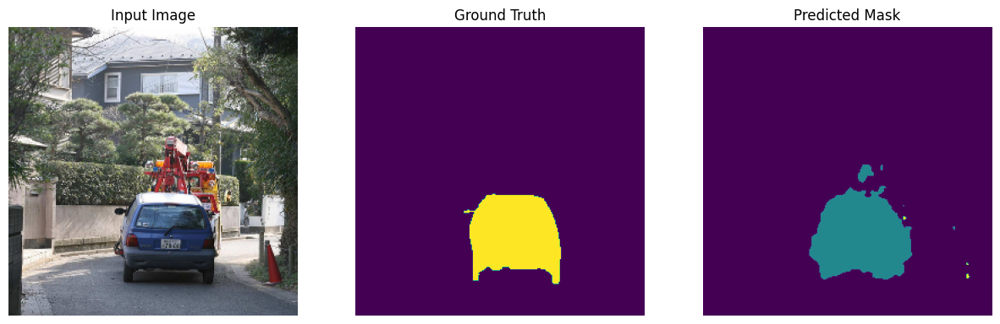

background
train


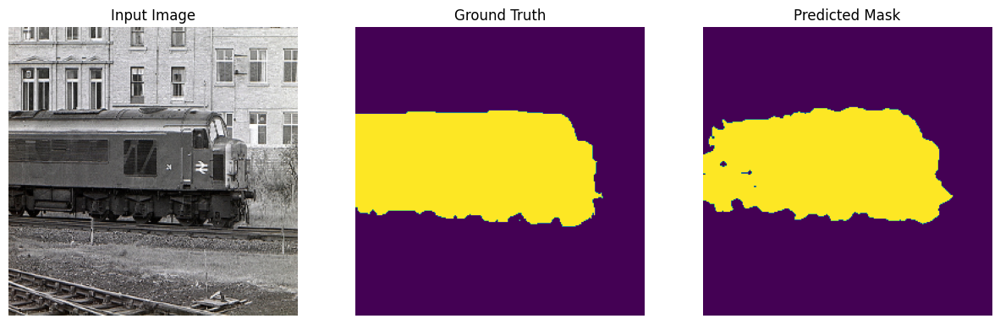

background
aeroplane
boat


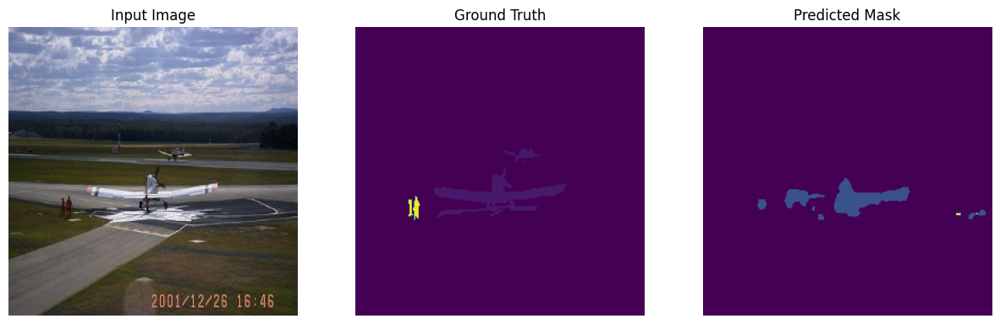

background
bottle


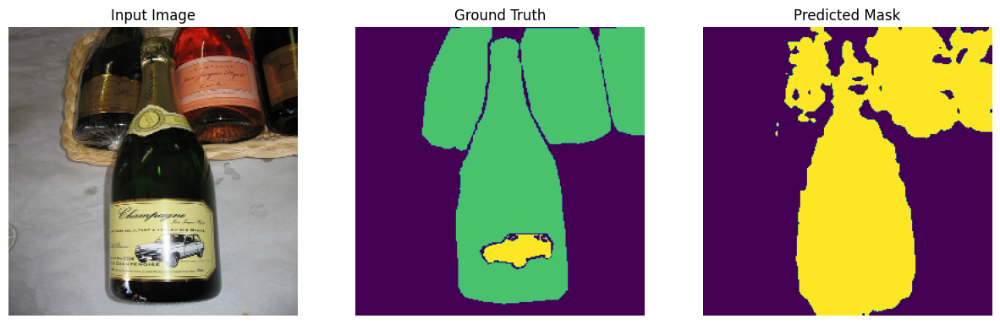

background
bicycle
diningtable
potted plant


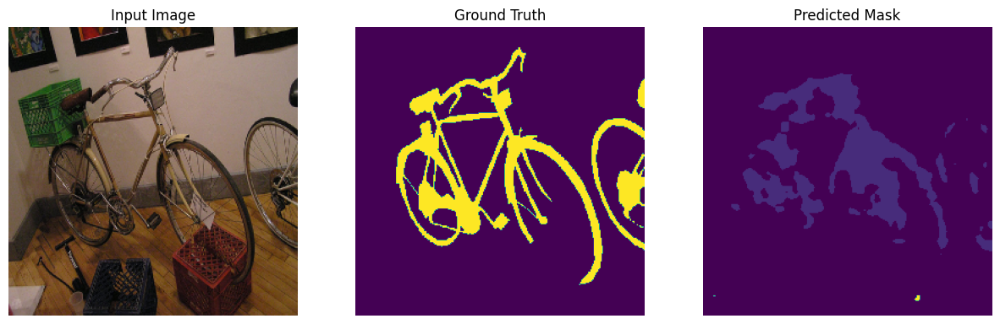

background
bird


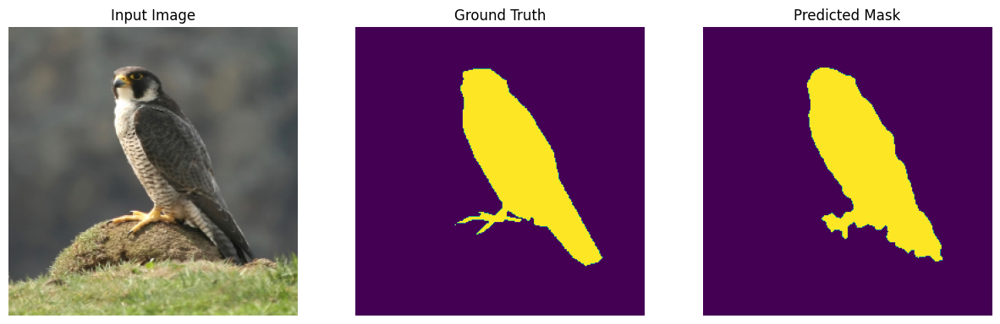

background
bird


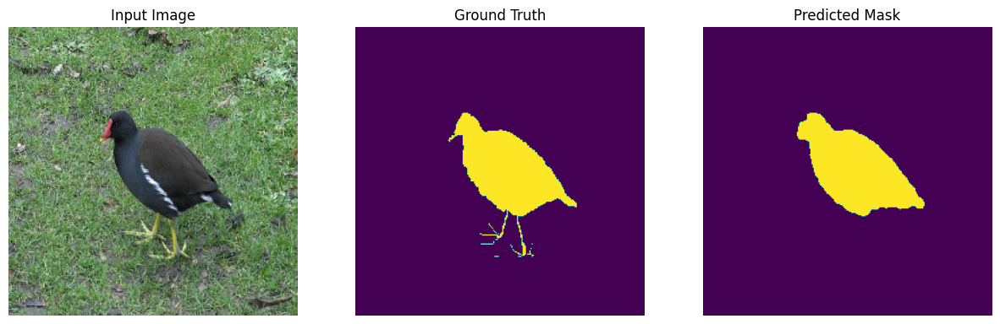

background
bicycle


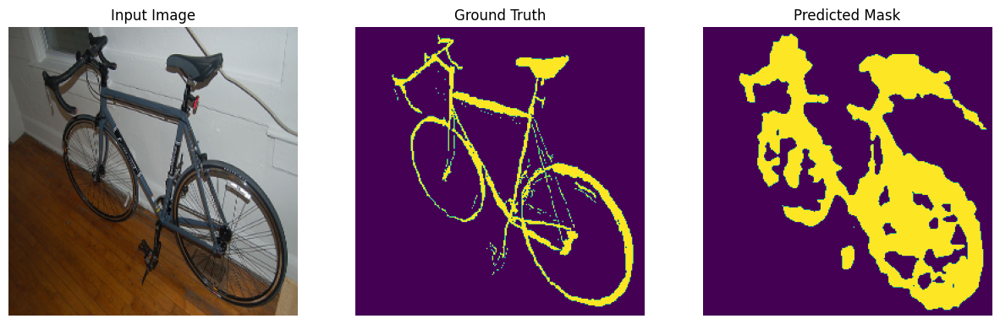

background
bird
sheep


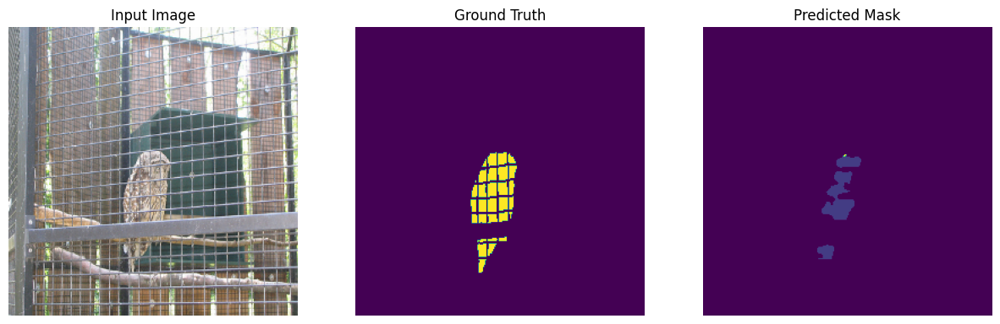

background
boat


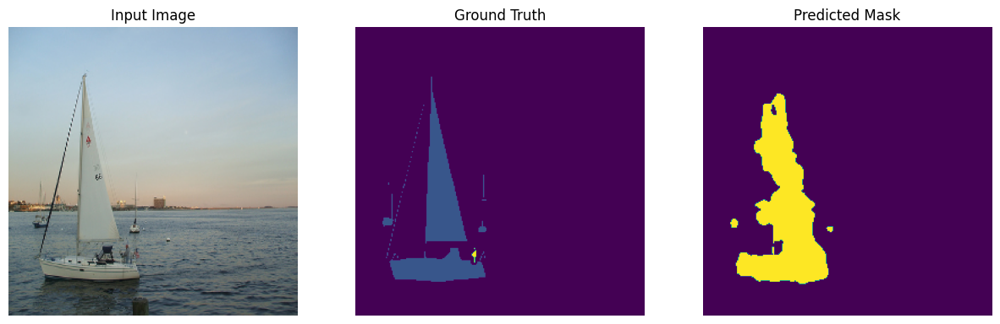

background
cat
dog


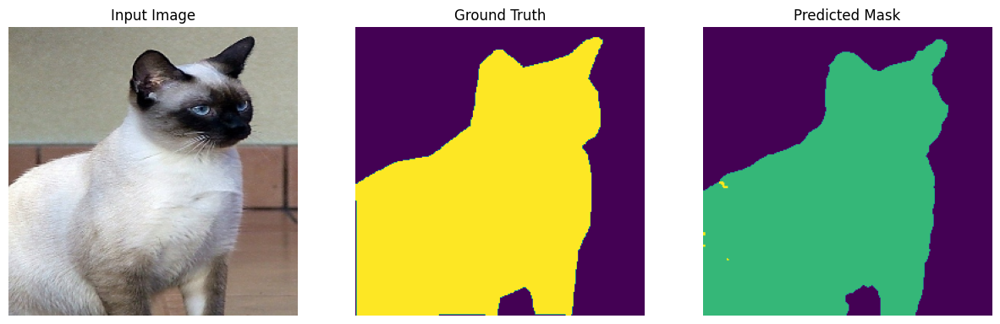

background
aeroplane
bicycle
bird
boat
car
diningtable
horse
motorbike
person
train


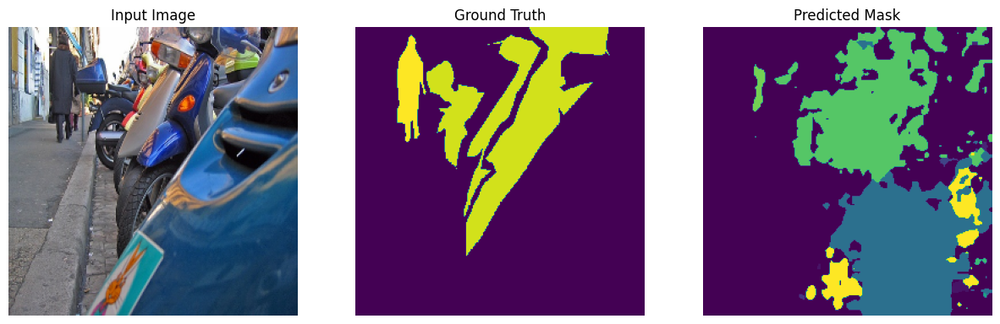

background
bird
boat
car
cow
horse
person
sheep
train


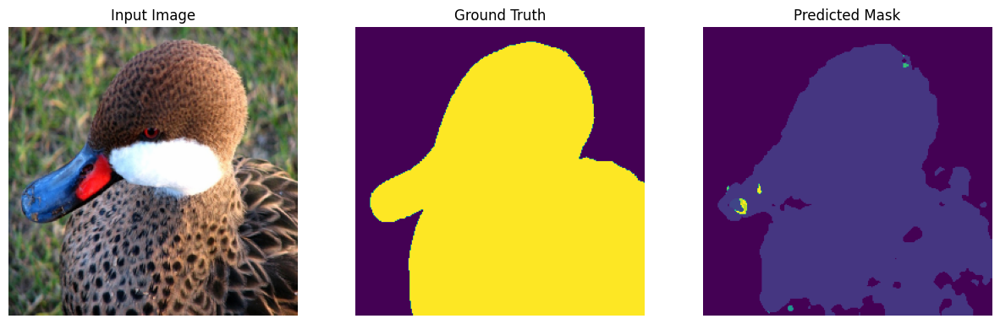

background
bird


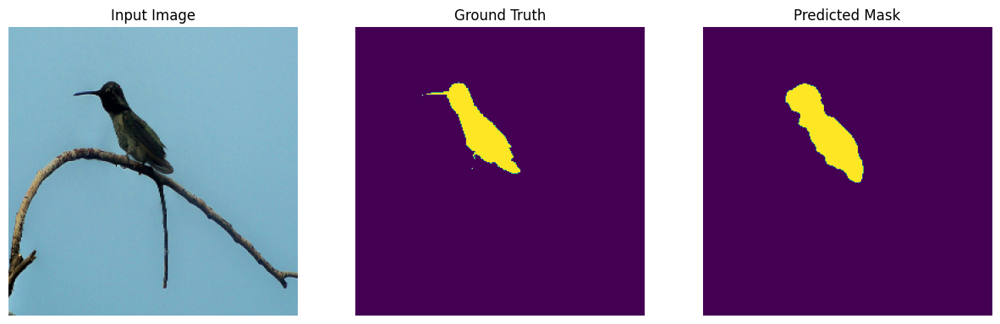

background
boat


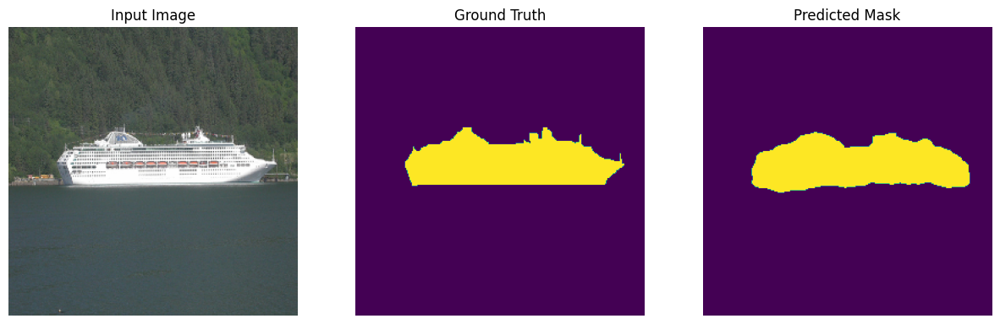

background
bicycle
chair
diningtable
person
potted plant
sofa


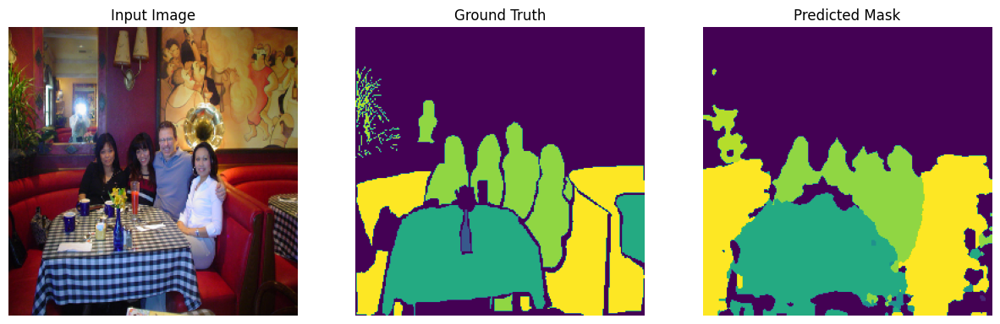

background
car


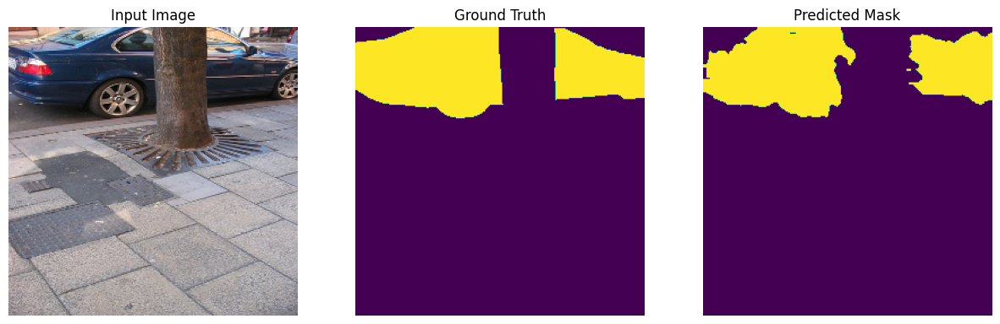

background
train


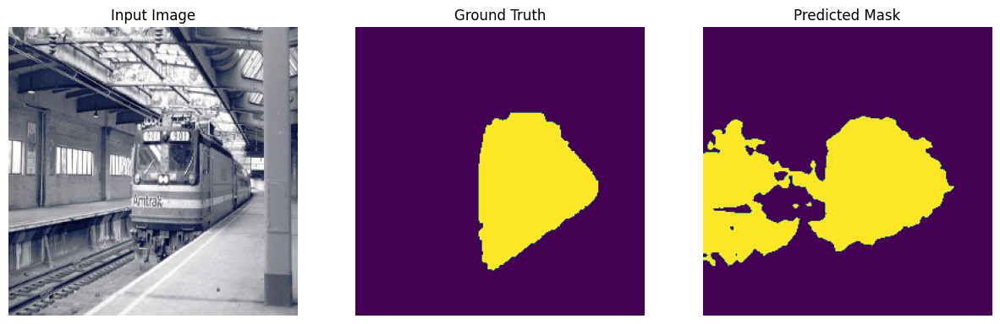

background
bicycle
car
person
train


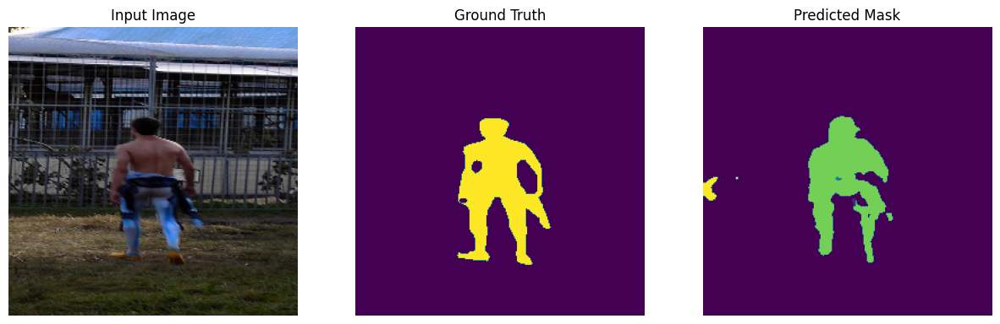

background
bicycle


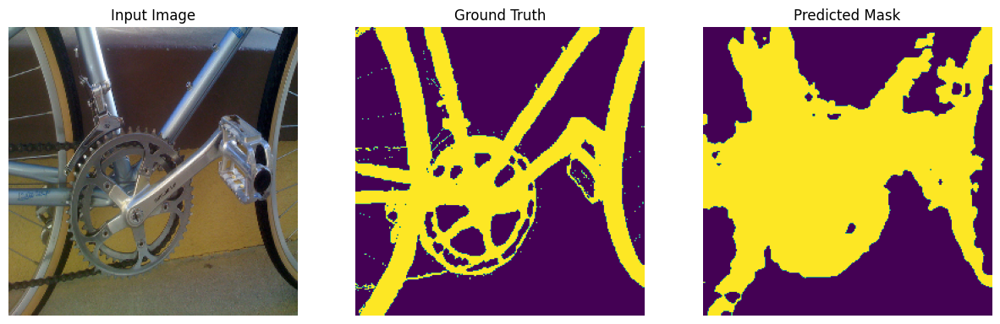

background
cow
dog
horse
sheep


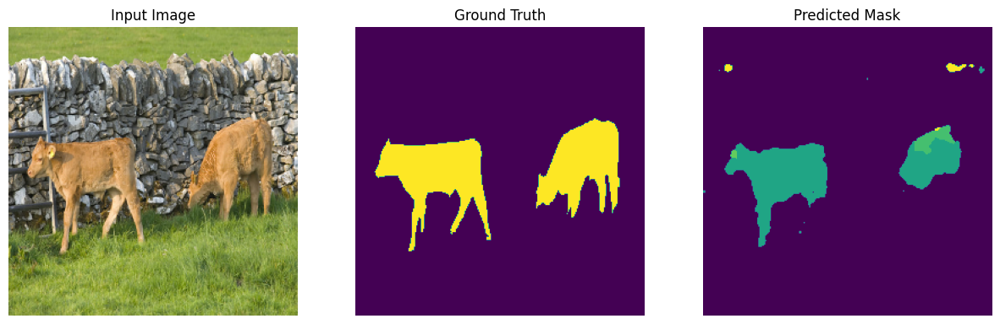

background
cow


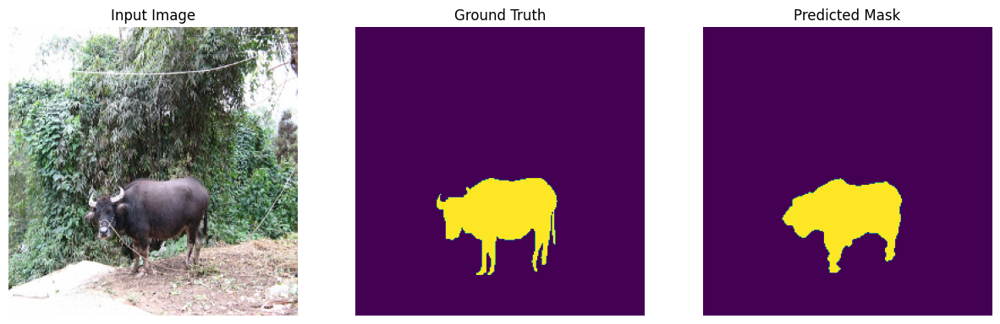

background
dog


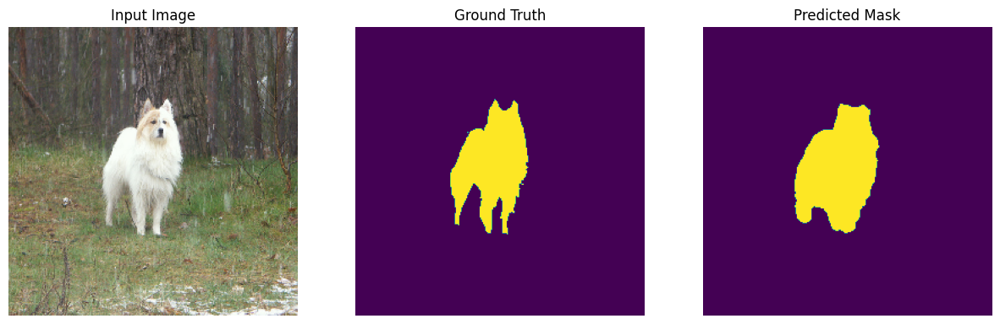

background
dog


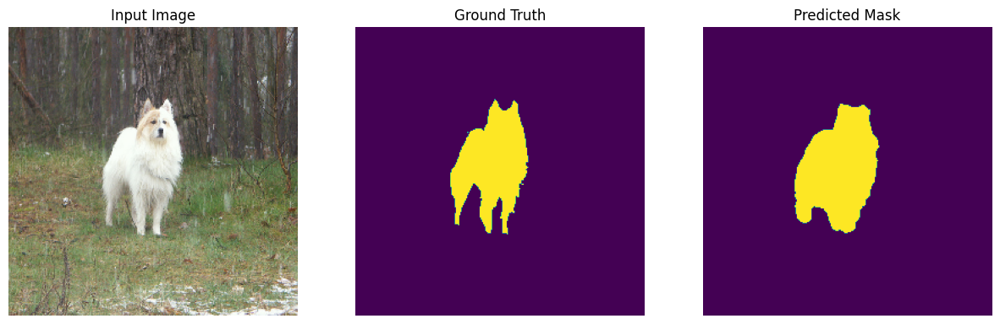

background
dog
person
sofa


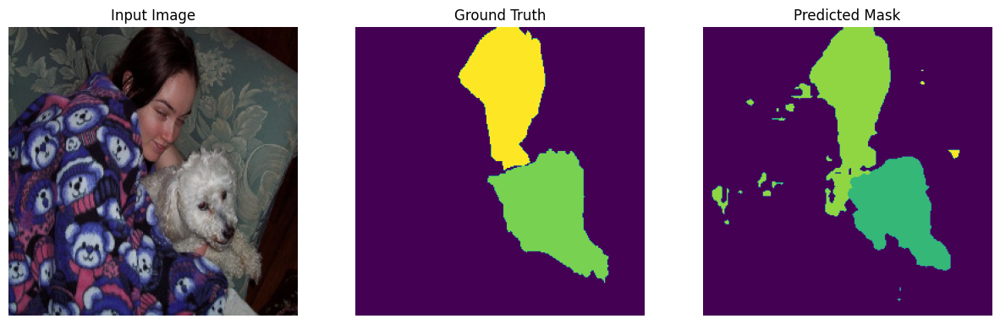

background
sheep


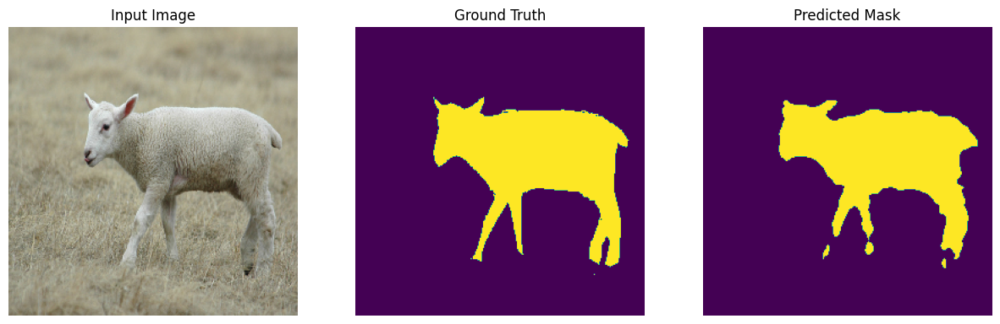

background
cow
horse


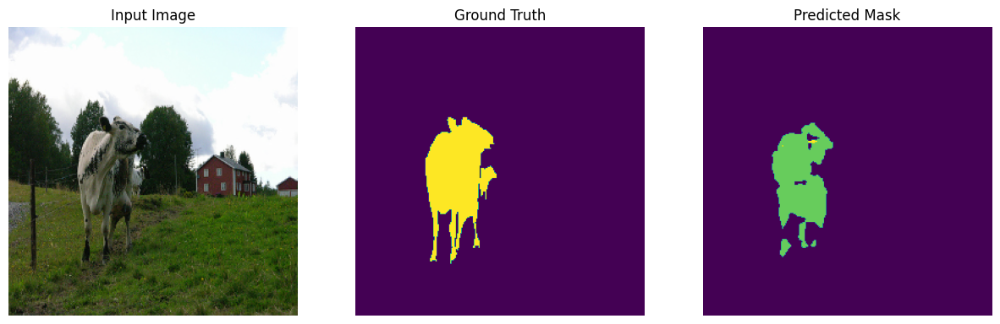

background
car
motorbike
person


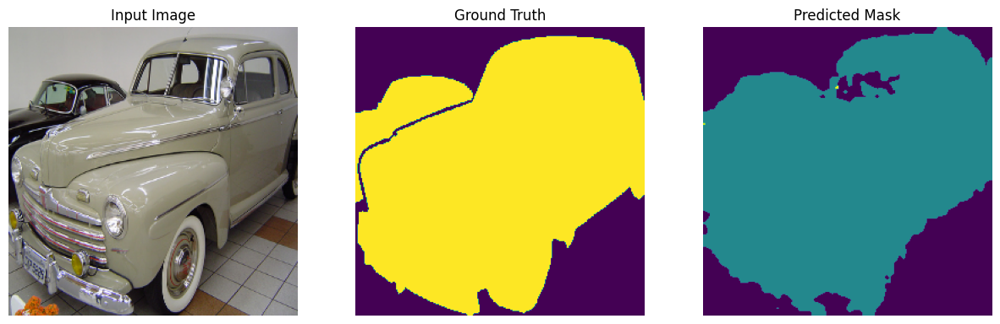

background
boat


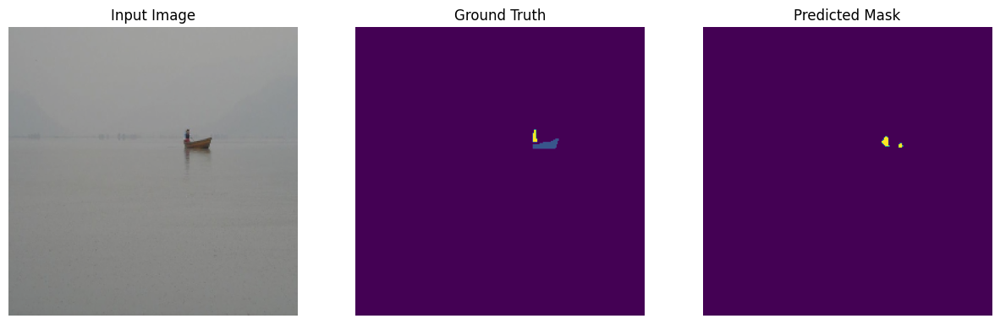

background
bird
cat
cow
dog
sheep


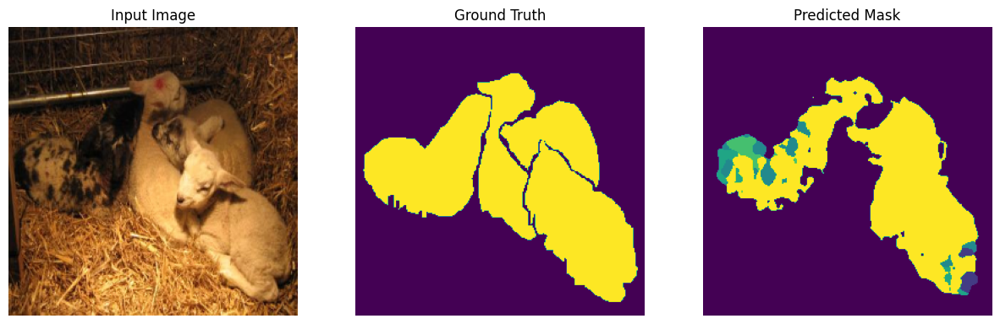

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import random
import torch

for i in range(30):
    # Randomly select an image and its ground truth from the test dataset
    id = random.randint(0, len(test_dataset) - 1)
    
    with torch.no_grad():
        model.eval()
        x, y = test_dataset.__getitem__(id)
        x = x.unsqueeze(0).to(device)  # Add batch dimension
        y_predict = model(x).argmax(dim=1).squeeze().cpu().numpy()  # Get predicted mask (2D array)
        
        # Print class labels for the predicted mask (if any)
        for class_id in np.unique(y_predict):
            print(VOC_CLASSES[class_id])

    # Convert the input image to a numpy array for visualization (if it's a tensor)
    x = x.squeeze().cpu().numpy().transpose(1, 2, 0)  # Convert to (H, W, C) for RGB
    
    # Convert ground truth (if y is one-hot encoded, apply argmax to get the class labels)
    ground_truth = y.squeeze().cpu().numpy()  # (H, W, 21) -> (H, W)
    ground_truth = np.argmax(ground_truth, axis=-1)  # Apply argmax to reduce to (H, W)
    
    # Define the mean and std values used for normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    # Unnormalize: multiply by std and add mean for each channel
    unnormalized_image = x * std + mean  # Unnormalize the image

    # Clip values to [0, 1] to make sure they are within the valid range for displaying
    unnormalized_image = np.clip(unnormalized_image, 0, 1)
    
    # Plot the input image, ground truth, and predicted mask
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Input Image (unnormalized)
    axes[0].imshow(unnormalized_image)
    axes[0].set_title("Input Image")
    axes[0].axis("off")

    # Ground Truth (2D array with class labels)
    axes[1].imshow(ground_truth)
    axes[1].set_title("Ground Truth")
    axes[1].axis("off")
    
    # Predicted Mask (2D array with class labels)
    axes[2].imshow(y_predict)
    axes[2].set_title("Predicted Mask")
    axes[2].axis("off")

    plt.show()


# Version2

In [ ]:
# https://pytorch.org/vision/main/generated/torchvision.ops.FeaturePyramidNetwork.html
import timm
import torchvision
from torchvision.ops import FeaturePyramidNetwork
from collections import OrderedDict
class FPNSegmentation(nn.Module):
    def __init__(self, backbone_name, fpn_channel, n_classes):
        super().__init__()
        self.backbone = timm.create_model(backbone_name, pretrained=True, features_only=True, out_indices = (1,2,3,4)) #0 gần với ảnh đầu vào có thể gây nhiễu
        self.n_classes = n_classes
        self.fpn_channel = fpn_channel
        self.in_channels_list = self.backbone.feature_info.channels()
        # print(self.in_channels_list)
        # self.fpn = FeaturePyramidNetwork([256, 512, 1024, 2048], 5) # in_channels_list, out_channels
        self.fpn = FeaturePyramidNetwork(self.in_channels_list, self.fpn_channel)
        self.conv_cls = nn.Conv2d(self.fpn_channel, self.n_classes, 1, 1, 0)


    def forward(self, x):
        # x = self.backbone(x)
        # for x in x:
        #     print(x.shape)
        # return None
        ori_size = x.shape[2:] # (H, W)
        x1, x2, x3, x4 = self.backbone(x)
        features = OrderedDict()
        features["x1"] = x1
        features["x2"] = x2
        features["x3"] = x3
        features["x4"] = x4
        fpn_features = self.fpn(features)
        # print([(k, v.shape) for k, v in fpn_features.items()])

        x = fpn_features["x1"] \
            + F.interpolate(fpn_features["x2"], size=fpn_features["x1"].shape[2:], mode="bilinear") \
            + F.interpolate(fpn_features["x3"], size=fpn_features["x1"].shape[2:], mode="bilinear") \
            + F.interpolate(fpn_features["x4"], size=fpn_features["x1"].shape[2:], mode="bilinear")
        x = F.interpolate(x, size=ori_size, mode="bilinear")
        x = self.conv_cls(x)
        return x
        
# model = FPNSegmentation("resnet50", 256, 21)
# x = torch.rand(2,3,256,256)
# y = model(x)      
# print(y.shape)

In [10]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_size = 16
n_workers = 4
print("num_workers =", n_workers)
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                          shuffle=True, num_workers=n_workers)
testloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,
                                          shuffle=False, num_workers=n_workers)

model = FPNSegmentation("resnet101", 256, 21).to(device)

# criterion = smp.losses.DiceLoss(mode="multiclass", classes=21)
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
n_eps = 60

train_loss_meter = AverageMeter()
intersection_meter = AverageMeter()
union_meter = AverageMeter()
target_meter = AverageMeter()
for ep in range(1, 1+n_eps):
    train_loss_meter.reset()
    intersection_meter.reset()
    union_meter.reset()
    target_meter.reset()
    model.train()

    for batch_id, (x, y) in enumerate(tqdm(trainloader), start=1):
        optimizer.zero_grad()
        n = x.shape[0]
        x = x.to(device).float()
        y = y.to(device).long()
        y = y.argmax(dim=-1)  # Convert (B, 256, 256, 21) -> (B, 256, 256)
        # print(y.shape)
        y_hat = model(x) #(B, C, H, W)
        # print(y_hat.shape)
        loss = criterion(y_hat, y) #(B, C, H, W) >< (B, H, W)
        loss.backward()
        optimizer.step()

        #save metrics
        with torch.no_grad():
            train_loss_meter.update(loss.item())
            y_hat_mask = y_hat.argmax(dim=1).squeeze(1) # (B, C, H, W) -> (B, 1, H, W) -> (B, H, W)
            intersection, union, target = intersectionAndUnionGPU(y_hat_mask.float(), y.float(), 21)
            intersection_meter.update(intersection)
            union_meter.update(union)
            target_meter.update(target)

    #compute iou, dice
    with torch.no_grad():
        iou_class = intersection_meter.sum / (union_meter.sum + 1e-10) #vector 21D
        dice_class = (2 * intersection_meter.sum) / (intersection_meter.sum + union_meter.sum + 1e-10) #vector 21D

        mIoU = torch.mean(iou_class) #mean vector 21D
        mDice = torch.mean(dice_class) #mean vector 21D

    print("EP {}, train loss = {} IoU = {}, dice = {}".format(ep, train_loss_meter.avg, mIoU, mDice))
    
    if ep >= 58:
        torch.save(model.state_dict(), "modelFPN_v2_ep_{}.pth".format(ep))

num_workers = 4


100%|██████████| 92/92 [01:45<00:00,  1.15s/it]


EP 1, train loss = 2.185519530073456 IoU = 0.1403665840625763, dice = 0.22132505476474762


100%|██████████| 92/92 [01:45<00:00,  1.15s/it]


EP 2, train loss = 0.8636942304994749 IoU = 0.31303903460502625, dice = 0.45420682430267334


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 3, train loss = 0.6823404178671215 IoU = 0.3974725306034088, dice = 0.5486543774604797


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 4, train loss = 0.6006881261001462 IoU = 0.44445738196372986, dice = 0.5960139632225037


100%|██████████| 92/92 [01:47<00:00,  1.16s/it]


EP 5, train loss = 0.528432778366234 IoU = 0.48346129059791565, dice = 0.6330338716506958


100%|██████████| 92/92 [01:45<00:00,  1.15s/it]


EP 6, train loss = 0.47576859544800676 IoU = 0.5181074738502502, dice = 0.6644449830055237


100%|██████████| 92/92 [01:46<00:00,  1.15s/it]


EP 7, train loss = 0.44450138412092044 IoU = 0.5337756872177124, dice = 0.681547224521637


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 8, train loss = 0.40144721240453096 IoU = 0.5684049129486084, dice = 0.7103156447410583


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 9, train loss = 0.3587188516622004 IoU = 0.5888639092445374, dice = 0.7284255623817444


100%|██████████| 92/92 [01:46<00:00,  1.15s/it]


EP 10, train loss = 0.34300172588099603 IoU = 0.6062947511672974, dice = 0.7431977391242981


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 11, train loss = 0.32402994548496994 IoU = 0.6153469085693359, dice = 0.7503654956817627


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 12, train loss = 0.31097115057965985 IoU = 0.6372557282447815, dice = 0.7685202956199646


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 13, train loss = 0.2923813737604929 IoU = 0.6504349708557129, dice = 0.7782138586044312


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 14, train loss = 0.2800927157311336 IoU = 0.6574297547340393, dice = 0.7825185656547546


100%|██████████| 92/92 [01:47<00:00,  1.17s/it]


EP 15, train loss = 0.2615801377788834 IoU = 0.6674626469612122, dice = 0.792090117931366


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 16, train loss = 0.24841723817846048 IoU = 0.6808154582977295, dice = 0.8013839721679688


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 17, train loss = 0.24969171538301135 IoU = 0.6808907985687256, dice = 0.8026325106620789


100%|██████████| 92/92 [01:46<00:00,  1.15s/it]


EP 18, train loss = 0.23527144859342472 IoU = 0.694494366645813, dice = 0.8130917549133301


100%|██████████| 92/92 [01:46<00:00,  1.15s/it]


EP 19, train loss = 0.21789070996253387 IoU = 0.7106347680091858, dice = 0.8233975172042847


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 20, train loss = 0.22107076450534488 IoU = 0.710111141204834, dice = 0.8229312896728516


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 21, train loss = 0.21114301665321641 IoU = 0.7195503115653992, dice = 0.8305100798606873


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 22, train loss = 0.21375205100554487 IoU = 0.7162496447563171, dice = 0.8283689618110657


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 23, train loss = 0.19981790131524854 IoU = 0.729468822479248, dice = 0.8377721905708313


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 24, train loss = 0.19906689234725808 IoU = 0.7329155206680298, dice = 0.8393434882164001


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 25, train loss = 0.19819963998768642 IoU = 0.7272363305091858, dice = 0.8362790942192078


100%|██████████| 92/92 [01:45<00:00,  1.15s/it]


EP 26, train loss = 0.19170840683838594 IoU = 0.7337662577629089, dice = 0.8402597308158875


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 27, train loss = 0.1863719624993594 IoU = 0.7456565499305725, dice = 0.8482533693313599


100%|██████████| 92/92 [01:47<00:00,  1.17s/it]


EP 28, train loss = 0.18171031109016875 IoU = 0.7527772188186646, dice = 0.8543548583984375


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 29, train loss = 0.17872929014265537 IoU = 0.7491104006767273, dice = 0.8506642580032349


100%|██████████| 92/92 [01:46<00:00,  1.15s/it]


EP 30, train loss = 0.17503484621967957 IoU = 0.7508289217948914, dice = 0.8516286611557007


100%|██████████| 92/92 [01:46<00:00,  1.15s/it]


EP 31, train loss = 0.1674782399736021 IoU = 0.7583857178688049, dice = 0.8569579720497131


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 32, train loss = 0.16738341125133244 IoU = 0.7632971405982971, dice = 0.8607476949691772


100%|██████████| 92/92 [01:47<00:00,  1.16s/it]


EP 33, train loss = 0.16958369290375191 IoU = 0.7586839199066162, dice = 0.8574301600456238


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 34, train loss = 0.16547518312607123 IoU = 0.7650130391120911, dice = 0.8615797162055969


100%|██████████| 92/92 [01:46<00:00,  1.15s/it]


EP 35, train loss = 0.1602604539821977 IoU = 0.7705129384994507, dice = 0.8655250072479248


100%|██████████| 92/92 [01:46<00:00,  1.15s/it]


EP 36, train loss = 0.17261167267418426 IoU = 0.7589511275291443, dice = 0.8582673072814941


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 37, train loss = 0.16446667180761046 IoU = 0.7674663066864014, dice = 0.8636449575424194


100%|██████████| 92/92 [01:47<00:00,  1.16s/it]


EP 38, train loss = 0.15633648131852565 IoU = 0.7783893346786499, dice = 0.8707689046859741


100%|██████████| 92/92 [01:47<00:00,  1.17s/it]


EP 39, train loss = 0.148605829509704 IoU = 0.7841929793357849, dice = 0.8753874897956848


100%|██████████| 92/92 [01:50<00:00,  1.20s/it]


EP 40, train loss = 0.1513088162502517 IoU = 0.7839612364768982, dice = 0.8747779726982117


100%|██████████| 92/92 [01:47<00:00,  1.17s/it]


EP 41, train loss = 0.1496101233136395 IoU = 0.7844135165214539, dice = 0.8748477101325989


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 42, train loss = 0.1479400521873132 IoU = 0.7823310494422913, dice = 0.8717683553695679


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 43, train loss = 0.14675214165902656 IoU = 0.78879714012146, dice = 0.8778278231620789


100%|██████████| 92/92 [01:47<00:00,  1.17s/it]


EP 44, train loss = 0.14495750597637633 IoU = 0.7891935706138611, dice = 0.8779492378234863


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 45, train loss = 0.14174434737018918 IoU = 0.7901787757873535, dice = 0.8784801959991455


100%|██████████| 92/92 [01:46<00:00,  1.15s/it]


EP 46, train loss = 0.13855385998992817 IoU = 0.7945842742919922, dice = 0.8812947869300842


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 47, train loss = 0.14979015193555667 IoU = 0.7815938591957092, dice = 0.8735222816467285


100%|██████████| 92/92 [01:47<00:00,  1.17s/it]


EP 48, train loss = 0.14164923350124256 IoU = 0.791385293006897, dice = 0.8788529634475708


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 49, train loss = 0.13657139525141404 IoU = 0.7963612079620361, dice = 0.8824379444122314


100%|██████████| 92/92 [01:47<00:00,  1.17s/it]


EP 50, train loss = 0.1400858116052721 IoU = 0.792632520198822, dice = 0.8800408840179443


100%|██████████| 92/92 [01:47<00:00,  1.17s/it]


EP 51, train loss = 0.13283825252691042 IoU = 0.7991117835044861, dice = 0.8840394616127014


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 52, train loss = 0.13044480145301507 IoU = 0.8040509819984436, dice = 0.8873279094696045


100%|██████████| 92/92 [01:47<00:00,  1.17s/it]


EP 53, train loss = 0.13381120028055232 IoU = 0.8022301197052002, dice = 0.8863265514373779


100%|██████████| 92/92 [01:47<00:00,  1.17s/it]


EP 54, train loss = 0.128252018324059 IoU = 0.806351363658905, dice = 0.8887611627578735


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 55, train loss = 0.1362624263147945 IoU = 0.8005528450012207, dice = 0.8852613568305969


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 56, train loss = 0.13602162865192993 IoU = 0.798571765422821, dice = 0.8843527436256409


100%|██████████| 92/92 [01:46<00:00,  1.16s/it]


EP 57, train loss = 0.12590817030033338 IoU = 0.8094756603240967, dice = 0.8908947706222534


100%|██████████| 92/92 [01:45<00:00,  1.15s/it]


EP 58, train loss = 0.12824171781539917 IoU = 0.807251513004303, dice = 0.8895204663276672


100%|██████████| 92/92 [01:45<00:00,  1.15s/it]


EP 59, train loss = 0.12249231743423836 IoU = 0.811356782913208, dice = 0.8918694257736206


100%|██████████| 92/92 [01:45<00:00,  1.15s/it]


EP 60, train loss = 0.11844070968420609 IoU = 0.818695604801178, dice = 0.896932065486908


In [11]:
model.eval()
test_intersection_meter = AverageMeter()
test_union_meter = AverageMeter()
test_target_meter = AverageMeter()
with torch.no_grad():
    for batch_id, (x, y) in enumerate(tqdm(testloader), start=1):
        n = x.shape[0]
        x = x.to(device).float()
        y = y.to(device).long()
        y = y.argmax(dim=-1)  # Convert (B, 256, 256, 21) -> (B, 256, 256)

        y_hat = model(x)
        y_hat = y_hat.squeeze(1)
        y_hat_mask = y_hat.argmax(dim=1)
        
        intersection, union, target = intersectionAndUnionGPU(y_hat_mask, y, 21)
        test_intersection_meter.update(intersection)
        test_union_meter.update(union)
        test_target_meter.update(target)
        
    iou_class = test_intersection_meter.sum / (test_union_meter.sum + 1e-10)
    dice_class = 2*test_intersection_meter.sum / (test_intersection_meter.sum + test_union_meter.sum + 1e-10)

    mIoU = torch.mean(iou_class)
    mDice = torch.mean(dice_class)
        
print("TEST: IoU = {}, dice = {}".format(mIoU, mDice))

100%|██████████| 91/91 [01:38<00:00,  1.09s/it]

TEST: IoU = 0.6385723948478699, dice = 0.7627528309822083


background
bottle
diningtable
person


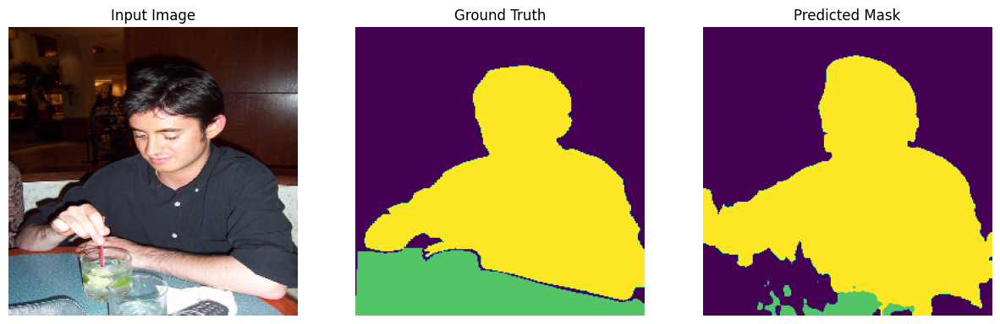

background
person
train


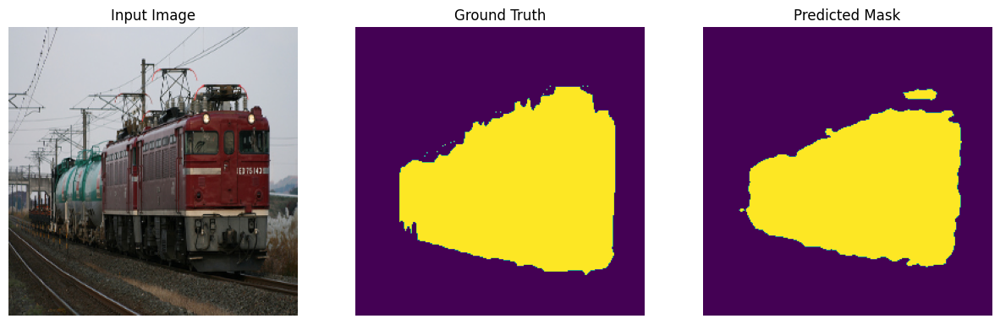

background
cat
dog


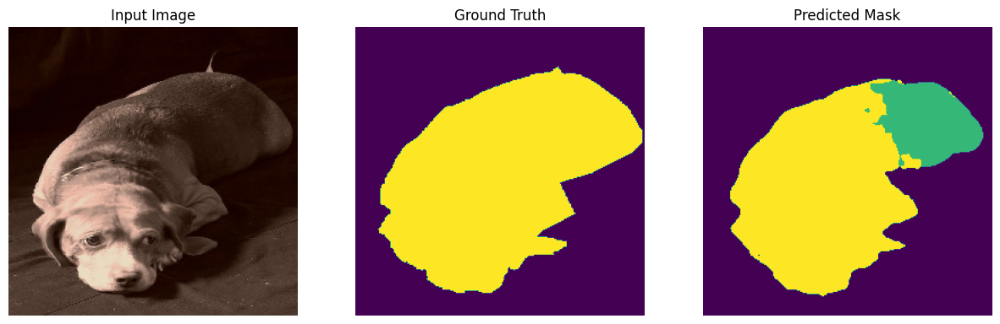

background
horse


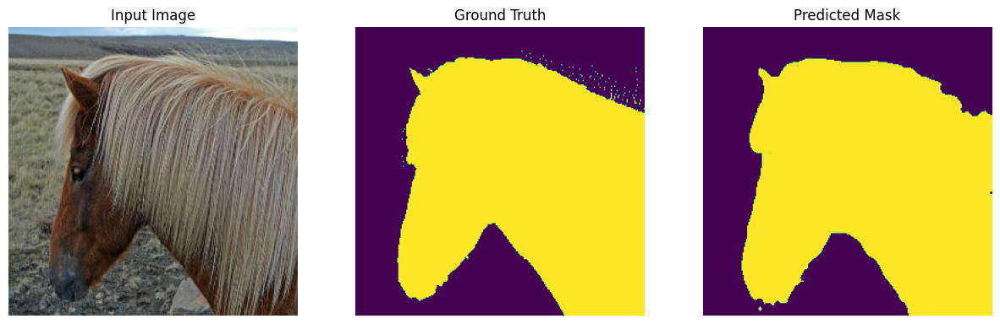

background
bird
sheep


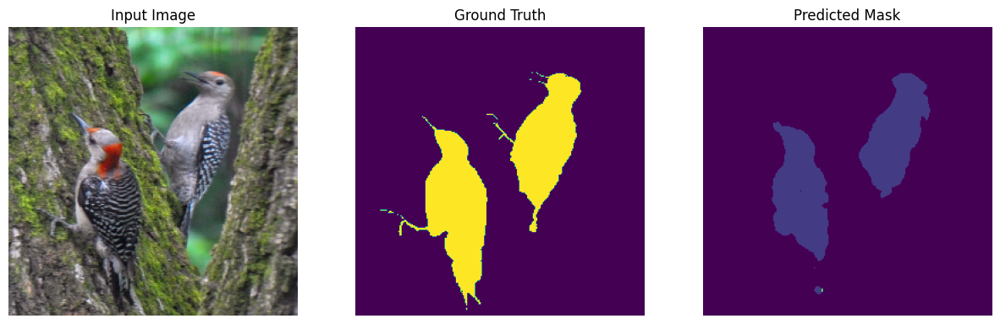

background
bottle
diningtable
person


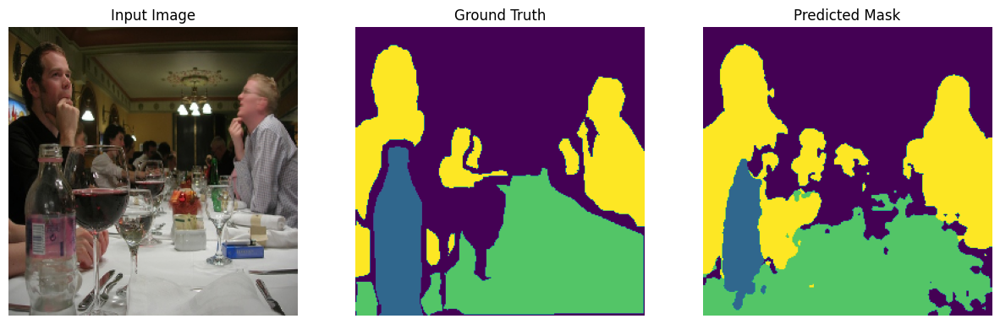

background
sheep
train


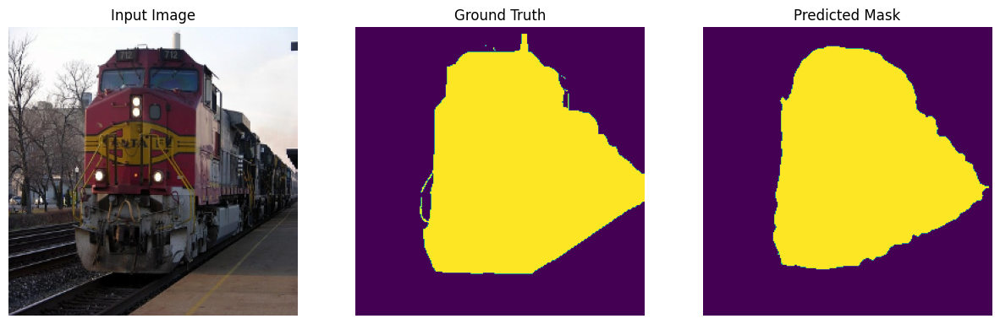

background
motorbike
person


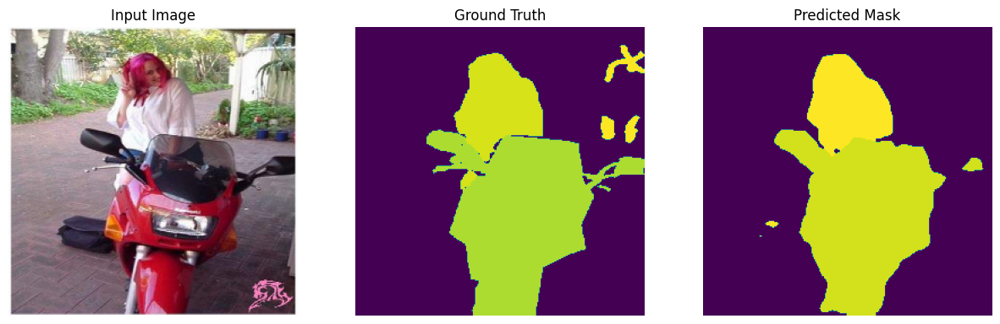

background
bus
car


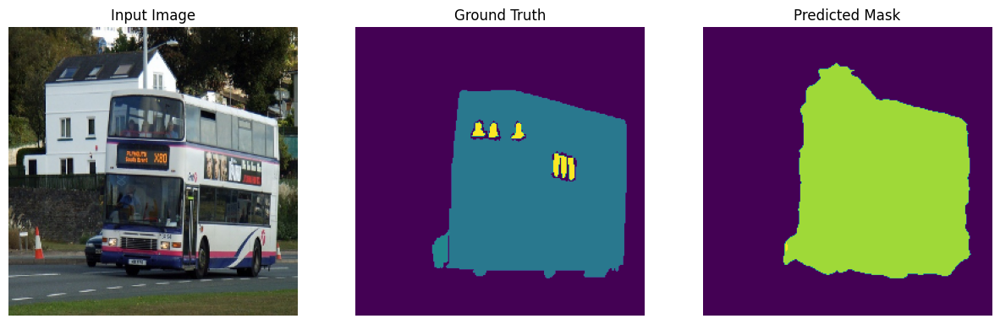

background
cat
dog


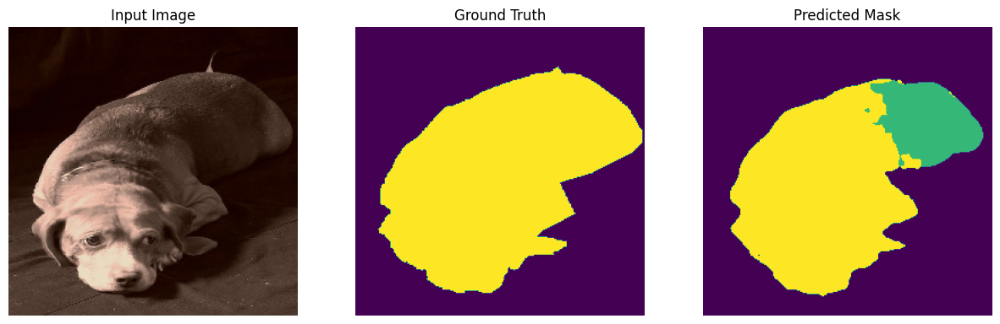

background
bicycle


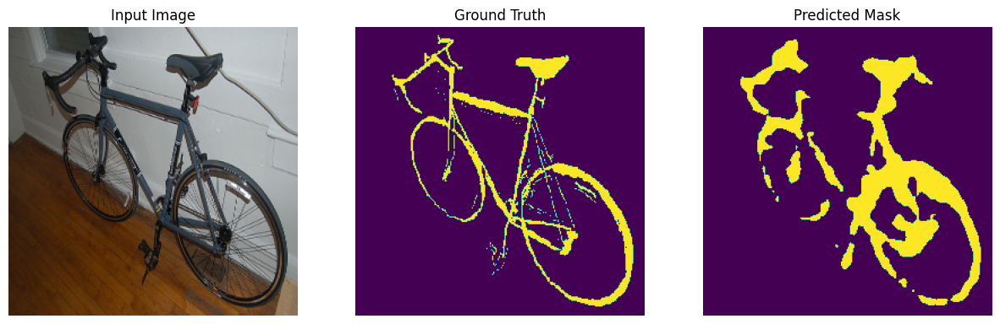

background
cat
dog
horse
sheep


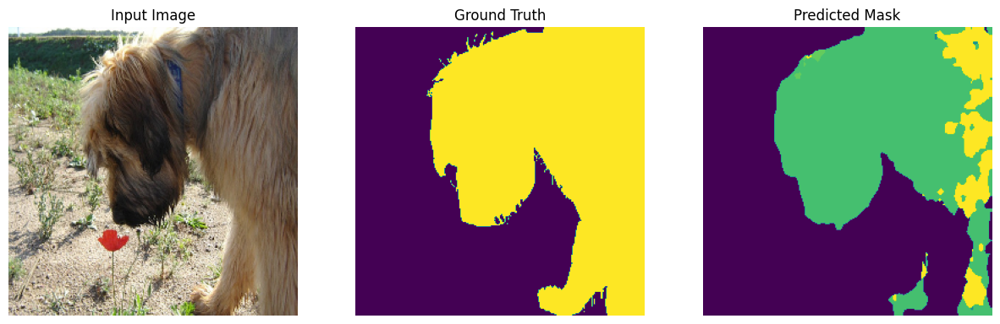

background
cow
sheep


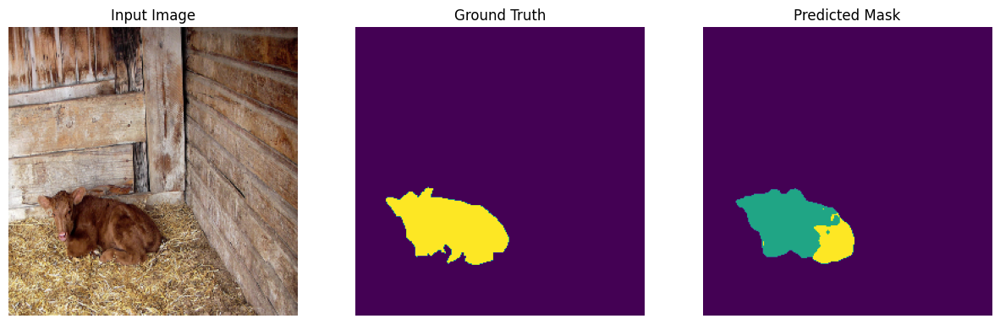

background
cat
dog
horse
person


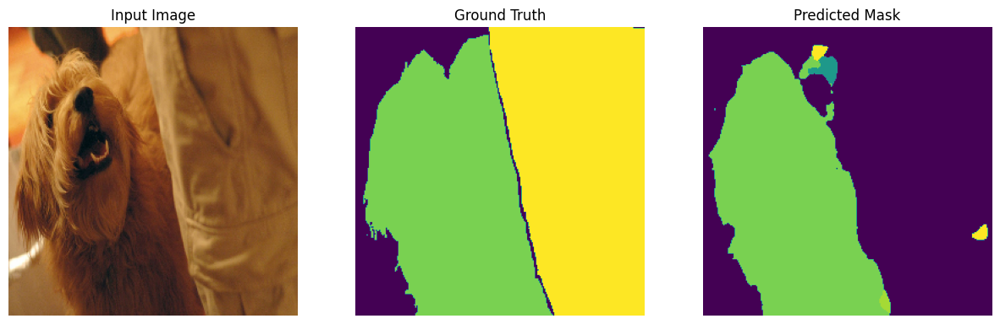

background
aeroplane
boat
bottle


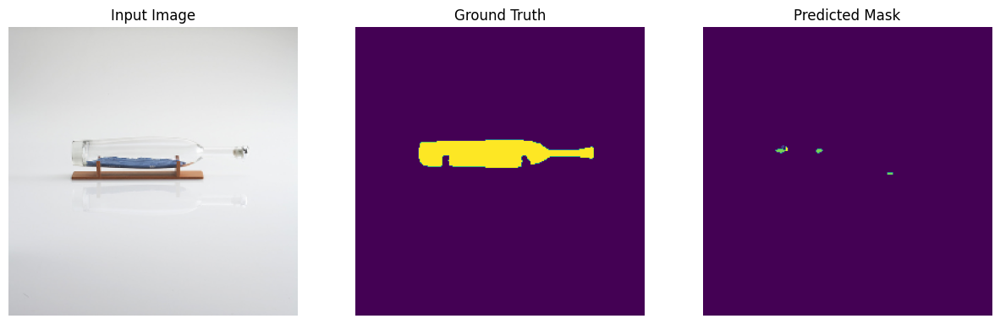

background
bottle


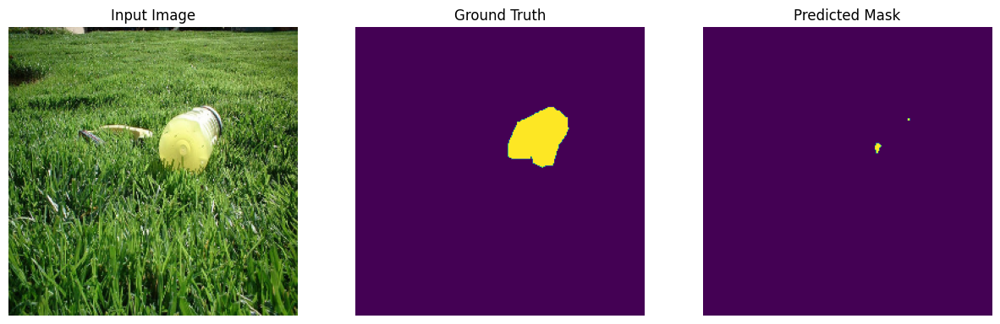

background
motorbike
person
tv/monitor


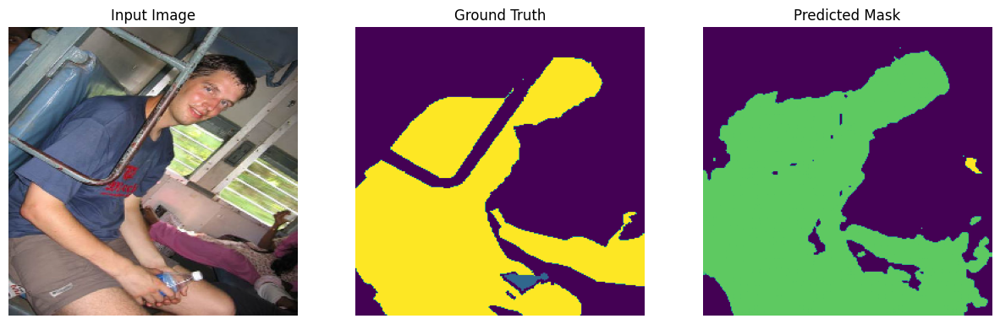

background
bottle


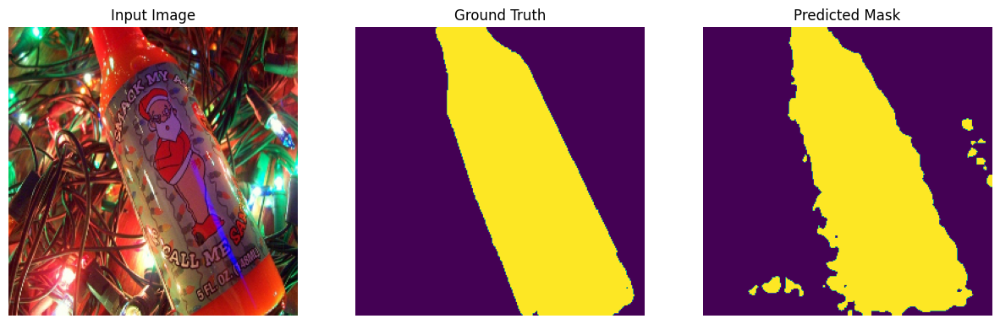

background
aeroplane
boat
cow
horse
person
sheep


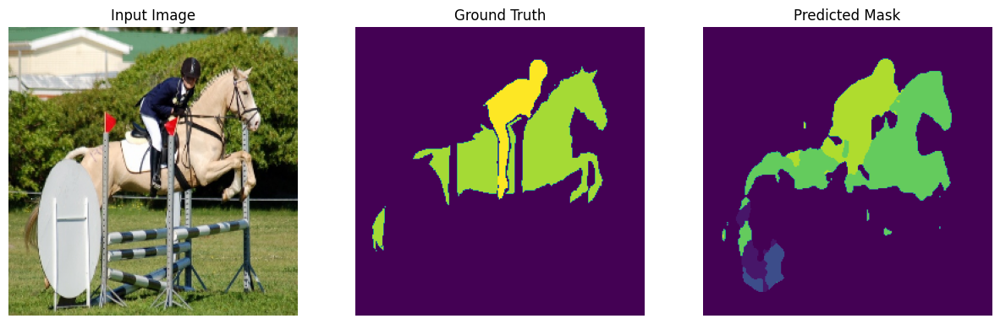

background
bottle
chair
diningtable
person


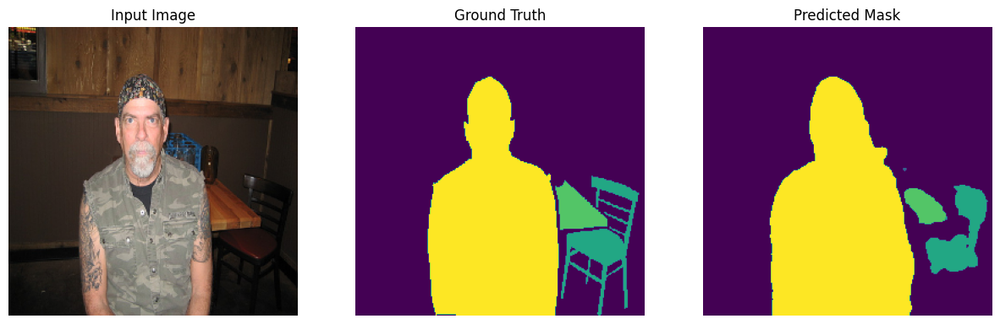

background
tv/monitor


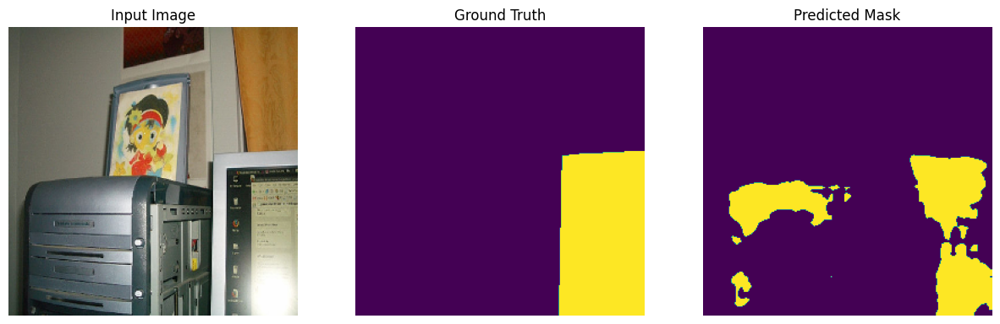

background
sheep


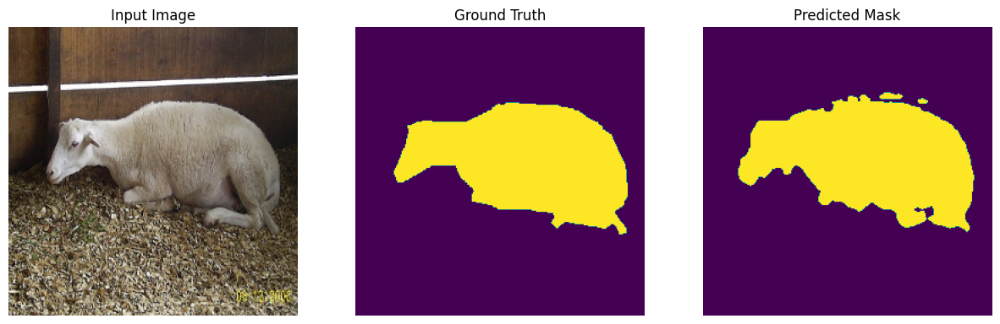

background
potted plant


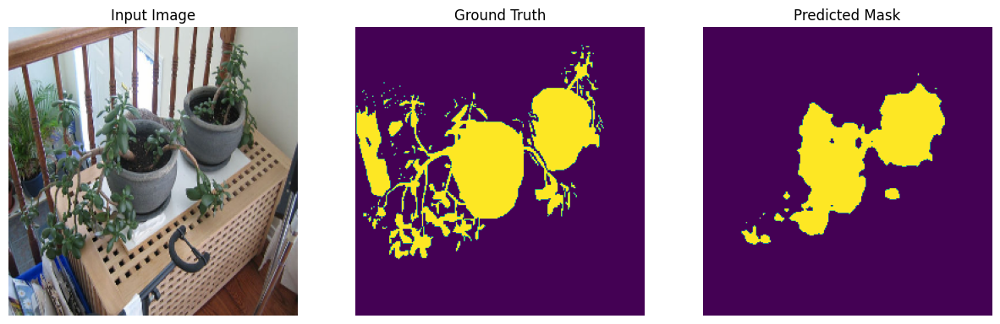

background
bottle
diningtable


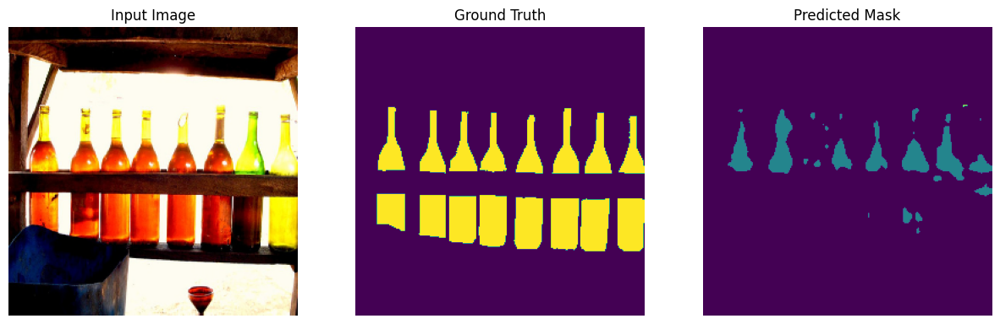

background
bicycle
chair
motorbike
person
potted plant


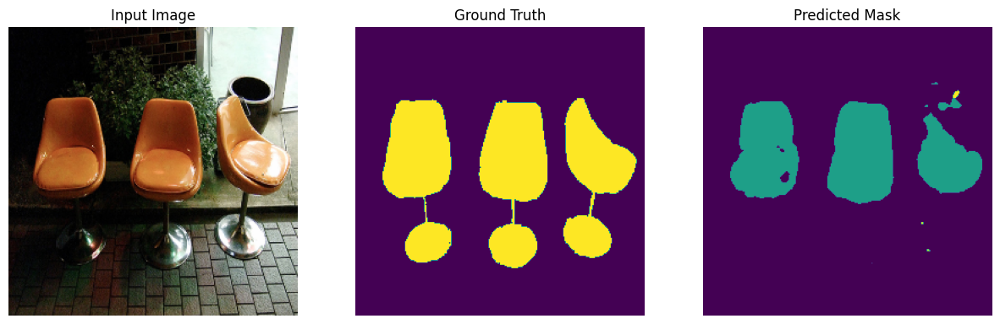

background
train


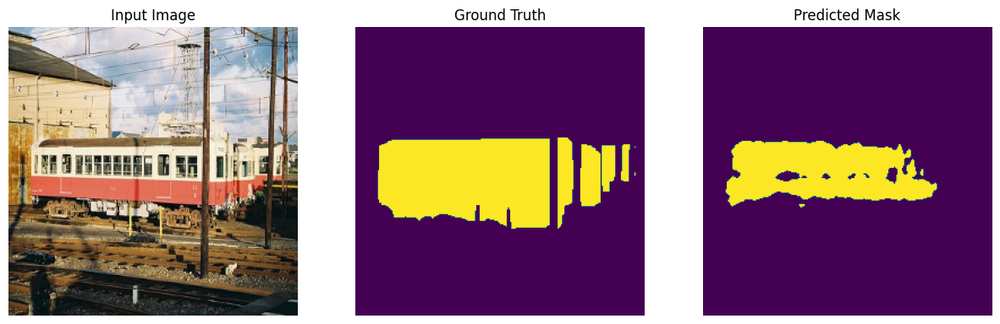

background
dog
motorbike
person
sheep


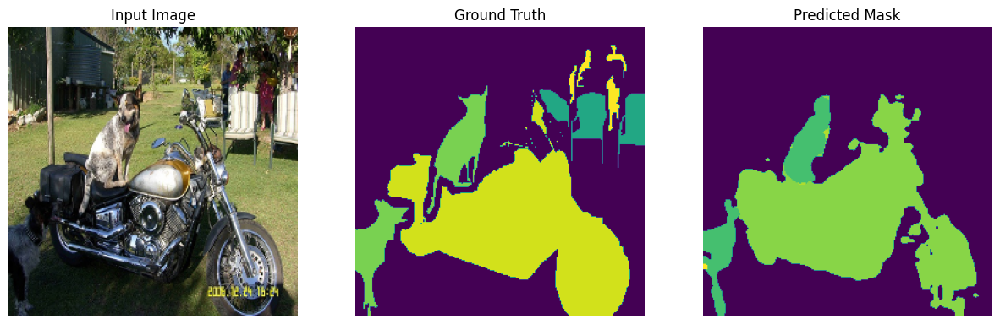

background
cow
horse
sheep


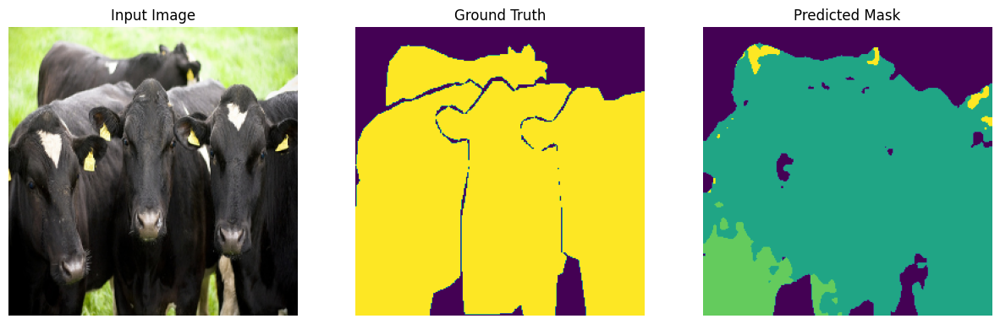

background
bus
train


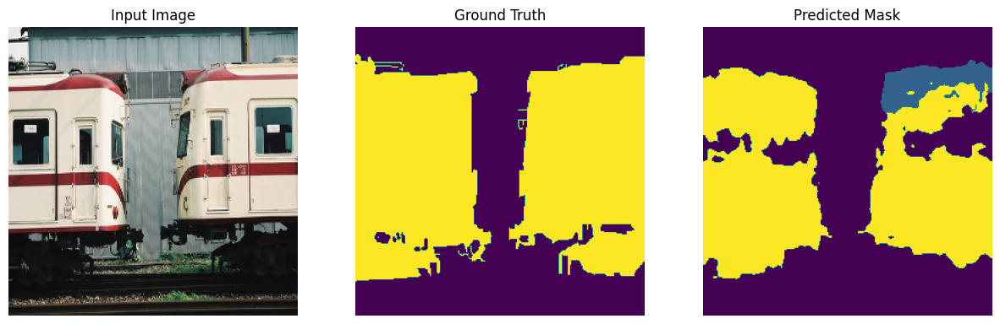

background
aeroplane


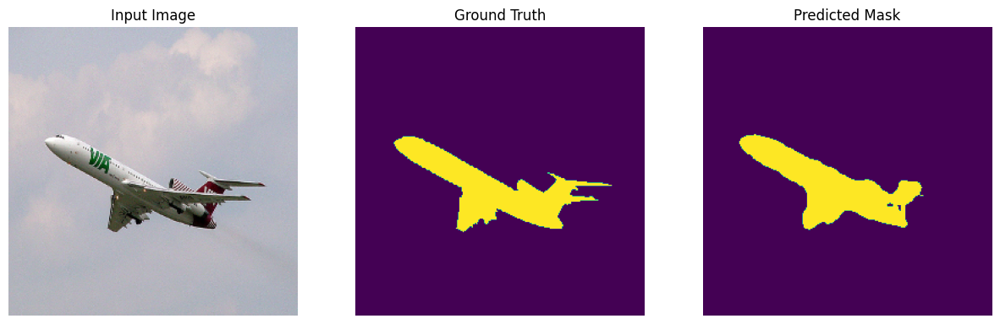

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import random
import torch

for i in range(30):
    # Randomly select an image and its ground truth from the test dataset
    id = random.randint(0, len(test_dataset) - 1)
    
    with torch.no_grad():
        model.eval()
        x, y = test_dataset.__getitem__(id)
        x = x.unsqueeze(0).to(device)  # Add batch dimension
        y_predict = model(x).argmax(dim=1).squeeze().cpu().numpy()  # Get predicted mask (2D array)
        
        # Print class labels for the predicted mask (if any)
        for class_id in np.unique(y_predict):
            print(VOC_CLASSES[class_id])

    # Convert the input image to a numpy array for visualization (if it's a tensor)
    x = x.squeeze().cpu().numpy().transpose(1, 2, 0)  # Convert to (H, W, C) for RGB
    
    # Convert ground truth (if y is one-hot encoded, apply argmax to get the class labels)
    ground_truth = y.squeeze().cpu().numpy()  # (H, W, 21) -> (H, W)
    ground_truth = np.argmax(ground_truth, axis=-1)  # Apply argmax to reduce to (H, W)
    
    # Define the mean and std values used for normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    # Unnormalize: multiply by std and add mean for each channel
    unnormalized_image = x * std + mean  # Unnormalize the image

    # Clip values to [0, 1] to make sure they are within the valid range for displaying
    unnormalized_image = np.clip(unnormalized_image, 0, 1)
    
    # Plot the input image, ground truth, and predicted mask
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Input Image (unnormalized)
    axes[0].imshow(unnormalized_image)
    axes[0].set_title("Input Image")
    axes[0].axis("off")

    # Ground Truth (2D array with class labels)
    axes[1].imshow(ground_truth)
    axes[1].set_title("Ground Truth")
    axes[1].axis("off")
    
    # Predicted Mask (2D array with class labels)
    axes[2].imshow(y_predict)
    axes[2].set_title("Predicted Mask")
    axes[2].axis("off")

    plt.show()


# Ver 3: Stack 2 FPN

In [7]:
# https://pytorch.org/vision/main/generated/torchvision.ops.FeaturePyramidNetwork.html
import timm
import torchvision
from torchvision.ops import FeaturePyramidNetwork
from collections import OrderedDict
class FPNSegmentationver3(nn.Module):
    def __init__(self, backbone_name, fpn_channel1, fpn_channel2, n_classes):
        super().__init__()
        self.backbone = timm.create_model(backbone_name, pretrained=True, features_only=True, out_indices = (1,2,3,4)) #0 gần với ảnh đầu vào có thể gây nhiễu
        self.n_classes = n_classes
        self.fpn_channel1 = fpn_channel1
        self.fpn_channel2 = fpn_channel2

        self.in_channels_list = self.backbone.feature_info.channels()
        self.fpn1 = FeaturePyramidNetwork(self.in_channels_list, self.fpn_channel1)
        self.fpn2 = FeaturePyramidNetwork([self.fpn_channel1]*4, self.fpn_channel2)
        self.conv_cls = nn.Conv2d(self.fpn_channel2, self.n_classes, 1, 1, 0)


    def forward(self, x):
        # x = self.backbone(x)
        # for x in x:
        #     print(x.shape)
        # return None
        ori_size = x.shape[2:] # (H, W)
        x1, x2, x3, x4 = self.backbone(x)
        features = OrderedDict()
        features["x1"] = x1
        features["x2"] = x2
        features["x3"] = x3
        features["x4"] = x4
        fpn_features1 = self.fpn1(features)
        fpn_features2 = self.fpn2(fpn_features1)
        
        # print([(k, v.shape) for k, v in fpn_features.items()])

        x = fpn_features2["x1"] \
            + F.interpolate(fpn_features2["x2"], size=fpn_features2["x1"].shape[2:], mode="bilinear") \
            + F.interpolate(fpn_features2["x3"], size=fpn_features2["x1"].shape[2:], mode="bilinear") \
            + F.interpolate(fpn_features2["x4"], size=fpn_features2["x1"].shape[2:], mode="bilinear")
        x = F.interpolate(x, size=ori_size, mode="bilinear")
        x = self.conv_cls(x)
        return x
        
model = FPNSegmentationver3("resnet50", 256, 128, 21)
x = torch.rand(2,3,256,256)
y = model(x)      
print(y.shape)

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

torch.Size([2, 21, 256, 256])


In [8]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_size = 32
n_workers = 4
print("num_workers =", n_workers)
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                          shuffle=True, num_workers=n_workers)
testloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,
                                          shuffle=False, num_workers=n_workers)

model = FPNSegmentationver3("resnet101", 256, 128, 21).to(device)

# criterion = smp.losses.DiceLoss(mode="multiclass", classes=21)
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
n_eps = 60

train_loss_meter = AverageMeter()
intersection_meter = AverageMeter()
union_meter = AverageMeter()
target_meter = AverageMeter()

num_workers = 4


model.safetensors:   0%|          | 0.00/179M [00:00<?, ?B/s]

In [9]:
for ep in range(1, 1+n_eps):
    train_loss_meter.reset()
    intersection_meter.reset()
    union_meter.reset()
    target_meter.reset()
    model.train()

    for batch_id, (x, y) in enumerate(tqdm(trainloader), start=1):
        optimizer.zero_grad()
        n = x.shape[0]
        x = x.to(device).float()
        y = y.to(device).long()
        y = y.argmax(dim=-1)  # Convert (B, 256, 256, 21) -> (B, 256, 256)
        # print(y.shape)
        y_hat = model(x) #(B, C, H, W)
        # print(y_hat.shape)
        loss = criterion(y_hat, y) #(B, C, H, W) >< (B, H, W)
        loss.backward()
        optimizer.step()

        #save metrics
        with torch.no_grad():
            train_loss_meter.update(loss.item())
            y_hat_mask = y_hat.argmax(dim=1).squeeze(1) # (B, C, H, W) -> (B, 1, H, W) -> (B, H, W)
            intersection, union, target = intersectionAndUnionGPU(y_hat_mask.float(), y.float(), 21)
            intersection_meter.update(intersection)
            union_meter.update(union)
            target_meter.update(target)

    #compute iou, dice
    with torch.no_grad():
        iou_class = intersection_meter.sum / (union_meter.sum + 1e-10) #vector 21D
        dice_class = (2 * intersection_meter.sum) / (intersection_meter.sum + union_meter.sum + 1e-10) #vector 21D

        mIoU = torch.mean(iou_class) #mean vector 21D
        mDice = torch.mean(dice_class) #mean vector 21D

    print("EP {}, train loss = {} IoU = {}, dice = {}".format(ep, train_loss_meter.avg, mIoU, mDice))
    
    if ep >= 58:
        torch.save(model.state_dict(), "modelFPNver3_ep_{}.pth".format(ep))

100%|██████████| 46/46 [01:51<00:00,  2.43s/it]


EP 1, train loss = 3.332961167978204 IoU = 0.11222145706415176, dice = 0.1764734983444214


100%|██████████| 46/46 [01:51<00:00,  2.42s/it]


EP 2, train loss = 1.1744449151598888 IoU = 0.2786065340042114, dice = 0.4114930331707001


100%|██████████| 46/46 [01:50<00:00,  2.41s/it]


EP 3, train loss = 0.8477371412774791 IoU = 0.3759916126728058, dice = 0.5258809328079224


100%|██████████| 46/46 [01:48<00:00,  2.36s/it]


EP 4, train loss = 0.7539289094831633 IoU = 0.4122774004936218, dice = 0.5639240145683289


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 5, train loss = 0.6283767573211504 IoU = 0.46777570247650146, dice = 0.6203406453132629


100%|██████████| 46/46 [01:50<00:00,  2.40s/it]


EP 6, train loss = 0.5437373648519102 IoU = 0.5025705099105835, dice = 0.6514779925346375


100%|██████████| 46/46 [01:51<00:00,  2.41s/it]


EP 7, train loss = 0.49555876203205274 IoU = 0.5291711688041687, dice = 0.6766030192375183


100%|██████████| 46/46 [01:50<00:00,  2.40s/it]


EP 8, train loss = 0.464239996412526 IoU = 0.54478919506073, dice = 0.6911947131156921


100%|██████████| 46/46 [01:50<00:00,  2.40s/it]


EP 9, train loss = 0.43118445121723675 IoU = 0.5667027235031128, dice = 0.709396243095398


100%|██████████| 46/46 [01:49<00:00,  2.39s/it]


EP 10, train loss = 0.3951890915632248 IoU = 0.5912763476371765, dice = 0.7301421761512756


100%|██████████| 46/46 [01:49<00:00,  2.37s/it]


EP 11, train loss = 0.37441613330789236 IoU = 0.6009897589683533, dice = 0.7393974661827087


100%|██████████| 46/46 [01:49<00:00,  2.37s/it]


EP 12, train loss = 0.36328019914419757 IoU = 0.6041330695152283, dice = 0.741754412651062


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 13, train loss = 0.3349629527200823 IoU = 0.6303662657737732, dice = 0.7629994750022888


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 14, train loss = 0.30845710376034613 IoU = 0.6467993855476379, dice = 0.7764899730682373


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 15, train loss = 0.30260551364525506 IoU = 0.6531268358230591, dice = 0.7801086902618408


100%|██████████| 46/46 [01:48<00:00,  2.36s/it]


EP 16, train loss = 0.28486557272465335 IoU = 0.6637122631072998, dice = 0.7888675928115845


100%|██████████| 46/46 [01:48<00:00,  2.35s/it]


EP 17, train loss = 0.2687861508001452 IoU = 0.6786786913871765, dice = 0.8004778027534485


100%|██████████| 46/46 [01:48<00:00,  2.35s/it]


EP 18, train loss = 0.25673191055007605 IoU = 0.6855137348175049, dice = 0.8057848811149597


100%|██████████| 46/46 [01:48<00:00,  2.37s/it]


EP 19, train loss = 0.25940150637989456 IoU = 0.6851463317871094, dice = 0.8057840466499329


100%|██████████| 46/46 [01:48<00:00,  2.36s/it]


EP 20, train loss = 0.24086609839097314 IoU = 0.7009502053260803, dice = 0.8176251649856567


100%|██████████| 46/46 [01:51<00:00,  2.42s/it]


EP 21, train loss = 0.24226243826358215 IoU = 0.6961603164672852, dice = 0.8141340017318726


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 22, train loss = 0.23274145340142044 IoU = 0.7079501748085022, dice = 0.8219550848007202


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 23, train loss = 0.224760795093101 IoU = 0.7115708589553833, dice = 0.8249486684799194


100%|██████████| 46/46 [01:51<00:00,  2.42s/it]


EP 24, train loss = 0.22447285574415457 IoU = 0.7132130861282349, dice = 0.8262094855308533


100%|██████████| 46/46 [01:49<00:00,  2.39s/it]


EP 25, train loss = 0.2080891955157985 IoU = 0.7272599935531616, dice = 0.8358994722366333


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 26, train loss = 0.21124240658853366 IoU = 0.7243815064430237, dice = 0.8340743184089661


100%|██████████| 46/46 [01:50<00:00,  2.40s/it]


EP 27, train loss = 0.2131497173205666 IoU = 0.723690927028656, dice = 0.8337549567222595


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 28, train loss = 0.2041984271744023 IoU = 0.7304429411888123, dice = 0.8379305005073547


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 29, train loss = 0.2017639561191849 IoU = 0.7299389839172363, dice = 0.8369537591934204


100%|██████████| 46/46 [01:48<00:00,  2.35s/it]


EP 30, train loss = 0.1964067619131959 IoU = 0.7396001815795898, dice = 0.8450206518173218


100%|██████████| 46/46 [01:48<00:00,  2.37s/it]


EP 31, train loss = 0.18909191307814224 IoU = 0.7475889921188354, dice = 0.8501967787742615


100%|██████████| 46/46 [01:49<00:00,  2.39s/it]


EP 32, train loss = 0.1855724366462749 IoU = 0.7475219368934631, dice = 0.8500257134437561


100%|██████████| 46/46 [01:49<00:00,  2.39s/it]


EP 33, train loss = 0.18366707278334576 IoU = 0.7504518032073975, dice = 0.8528163433074951


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 34, train loss = 0.17886788527602734 IoU = 0.7537201642990112, dice = 0.8541953563690186


100%|██████████| 46/46 [01:49<00:00,  2.37s/it]


EP 35, train loss = 0.17349139341841574 IoU = 0.7577065825462341, dice = 0.8569472432136536


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 36, train loss = 0.17639592127955478 IoU = 0.7598267793655396, dice = 0.8586616516113281


100%|██████████| 46/46 [01:49<00:00,  2.39s/it]


EP 37, train loss = 0.16883604843979297 IoU = 0.765786349773407, dice = 0.8626000881195068


100%|██████████| 46/46 [01:49<00:00,  2.37s/it]


EP 38, train loss = 0.16273222199600676 IoU = 0.7684838771820068, dice = 0.8642371296882629


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 39, train loss = 0.16777945666209512 IoU = 0.7648337483406067, dice = 0.8617711067199707


100%|██████████| 46/46 [01:50<00:00,  2.40s/it]


EP 40, train loss = 0.16361058195647987 IoU = 0.770054042339325, dice = 0.8654101490974426


100%|██████████| 46/46 [01:50<00:00,  2.39s/it]


EP 41, train loss = 0.1630704202081846 IoU = 0.770099401473999, dice = 0.8650805354118347


100%|██████████| 46/46 [01:48<00:00,  2.36s/it]


EP 42, train loss = 0.15865066582741943 IoU = 0.7714794874191284, dice = 0.8644589185714722


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 43, train loss = 0.1549107788697533 IoU = 0.7776876091957092, dice = 0.8702853322029114


100%|██████████| 46/46 [01:48<00:00,  2.35s/it]


EP 44, train loss = 0.15473097465608432 IoU = 0.7758282423019409, dice = 0.8689985871315002


100%|██████████| 46/46 [01:48<00:00,  2.35s/it]


EP 45, train loss = 0.1557037035084289 IoU = 0.7780501842498779, dice = 0.8706883192062378


100%|██████████| 46/46 [01:48<00:00,  2.36s/it]


EP 46, train loss = 0.14894615324295085 IoU = 0.7863979339599609, dice = 0.876192033290863


100%|██████████| 46/46 [01:47<00:00,  2.33s/it]


EP 47, train loss = 0.14995396785114123 IoU = 0.7840648889541626, dice = 0.8748041987419128


100%|██████████| 46/46 [01:48<00:00,  2.35s/it]


EP 48, train loss = 0.14751989734561546 IoU = 0.7844449281692505, dice = 0.8747023940086365


100%|██████████| 46/46 [01:50<00:00,  2.39s/it]


EP 49, train loss = 0.14669556672806325 IoU = 0.784406304359436, dice = 0.8750076293945312


100%|██████████| 46/46 [01:48<00:00,  2.36s/it]


EP 50, train loss = 0.14984335118661757 IoU = 0.784551739692688, dice = 0.8746091723442078


100%|██████████| 46/46 [01:48<00:00,  2.36s/it]


EP 51, train loss = 0.14714683543728746 IoU = 0.785552978515625, dice = 0.8751351833343506


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 52, train loss = 0.13830850986034973 IoU = 0.7961539626121521, dice = 0.8822996020317078


100%|██████████| 46/46 [01:48<00:00,  2.37s/it]


EP 53, train loss = 0.1367808246742124 IoU = 0.79624342918396, dice = 0.8822782039642334


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 54, train loss = 0.13932563429293426 IoU = 0.792967677116394, dice = 0.8804383277893066


100%|██████████| 46/46 [01:50<00:00,  2.40s/it]


EP 55, train loss = 0.13422856917199882 IoU = 0.8002532124519348, dice = 0.8849774599075317


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 56, train loss = 0.14026674709242323 IoU = 0.7917317748069763, dice = 0.8793686628341675


100%|██████████| 46/46 [01:49<00:00,  2.37s/it]


EP 57, train loss = 0.1339859947886156 IoU = 0.7994277477264404, dice = 0.8847536444664001


100%|██████████| 46/46 [01:49<00:00,  2.37s/it]


EP 58, train loss = 0.1314660615247229 IoU = 0.802132785320282, dice = 0.886262834072113


100%|██████████| 46/46 [01:51<00:00,  2.42s/it]


EP 59, train loss = 0.1341448544484118 IoU = 0.7982105016708374, dice = 0.8839393258094788


100%|██████████| 46/46 [01:49<00:00,  2.38s/it]


EP 60, train loss = 0.13049749495542567 IoU = 0.8038312792778015, dice = 0.8873738050460815


In [10]:
model.eval()
test_intersection_meter = AverageMeter()
test_union_meter = AverageMeter()
test_target_meter = AverageMeter()
with torch.no_grad():
    for batch_id, (x, y) in enumerate(tqdm(testloader), start=1):
        n = x.shape[0]
        x = x.to(device).float()
        y = y.to(device).long()
        y = y.argmax(dim=-1)  # Convert (B, 256, 256, 21) -> (B, 256, 256)

        y_hat = model(x)
        y_hat = y_hat.squeeze(1)
        y_hat_mask = y_hat.argmax(dim=1)
        
        intersection, union, target = intersectionAndUnionGPU(y_hat_mask, y, 21)
        test_intersection_meter.update(intersection)
        test_union_meter.update(union)
        test_target_meter.update(target)
        
    iou_class = test_intersection_meter.sum / (test_union_meter.sum + 1e-10)
    dice_class = 2*test_intersection_meter.sum / (test_intersection_meter.sum + test_union_meter.sum + 1e-10)

    mIoU = torch.mean(iou_class)
    mDice = torch.mean(dice_class)
        
print("TEST: IoU = {}, dice = {}".format(mIoU, mDice))

100%|██████████| 46/46 [01:41<00:00,  2.20s/it]

TEST: IoU = 0.6235200762748718, dice = 0.75076824426651


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import torch

for i in range(30):
    # Randomly select an image and its ground truth from the test dataset
    id = random.randint(0, len(test_dataset) - 1)
    
    with torch.no_grad():
        model.eval()
        x, y = test_dataset.__getitem__(id)
        x = x.unsqueeze(0).to(device)  # Add batch dimension
        y_predict = model(x).argmax(dim=1).squeeze().cpu().numpy()  # Get predicted mask (2D array)
        
        # Print class labels for the predicted mask (if any)
        for class_id in np.unique(y_predict):
            print(VOC_CLASSES[class_id])

    # Convert the input image to a numpy array for visualization (if it's a tensor)
    x = x.squeeze().cpu().numpy().transpose(1, 2, 0)  # Convert to (H, W, C) for RGB
    
    # Convert ground truth (if y is one-hot encoded, apply argmax to get the class labels)
    ground_truth = y.squeeze().cpu().numpy()  # (H, W, 21) -> (H, W)
    ground_truth = np.argmax(ground_truth, axis=-1)  # Apply argmax to reduce to (H, W)
    
    # Define the mean and std values used for normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    # Unnormalize: multiply by std and add mean for each channel
    unnormalized_image = x * std + mean  # Unnormalize the image

    # Clip values to [0, 1] to make sure they are within the valid range for displaying
    unnormalized_image = np.clip(unnormalized_image, 0, 1)
    
    # Plot the input image, ground truth, and predicted mask
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Input Image (unnormalized)
    axes[0].imshow(unnormalized_image)
    axes[0].set_title("Input Image")
    axes[0].axis("off")

    # Ground Truth (2D array with class labels)
    axes[1].imshow(ground_truth)
    axes[1].set_title("Ground Truth")
    axes[1].axis("off")
    
    # Predicted Mask (2D array with class labels)
    axes[2].imshow(y_predict)
    axes[2].set_title("Predicted Mask")
    axes[2].axis("off")

    plt.show()